# Imports

In [1]:
import itertools
import json
import numpy as np
import os
import math
import pandas as pd
from sys import path
from copy import copy, deepcopy
import warnings
warnings.filterwarnings("ignore")

In [2]:
path.append("ingestion_program/")
path.append("../Data_Generator")
path.append("DANN_program/")

# 1 - Translation

## 1.1 - Generate Data

In [3]:
from data_loader import get_settings_from_json
from data_generator_all_systematics import DataGenerator

In [4]:
data_dir = "DANN_data/Translation"

In [5]:
data_gen_settings = get_settings_from_json('data_jsons/DANN_jsons/Translation')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.generate_data()
    data_gen.save_data(directory=data_dir, file_index=index+1)
    

## 1.2 - Load Data

In [6]:
from data_io import load_data, show_data_statistics, write

In [7]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  DANN_data/Translation
[*] train data dir :  DANN_data/Translation\train\data
[*] train labels dir :  DANN_data/Translation\train\labels
[*] test data dir :  DANN_data/Translation\test\data
[*] test labels dir :  DANN_data/Translation\test\labels
[*] settings dir :  DANN_data/Translation\settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




## 1.3 - Visualize Data

In [8]:
from visualize import visualize_data

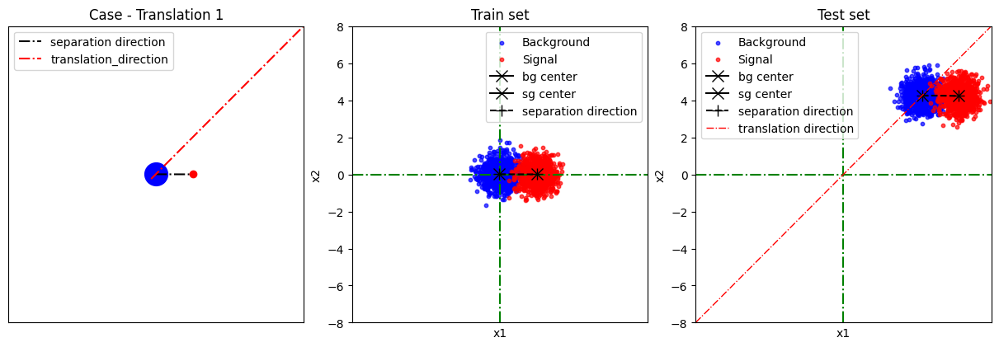

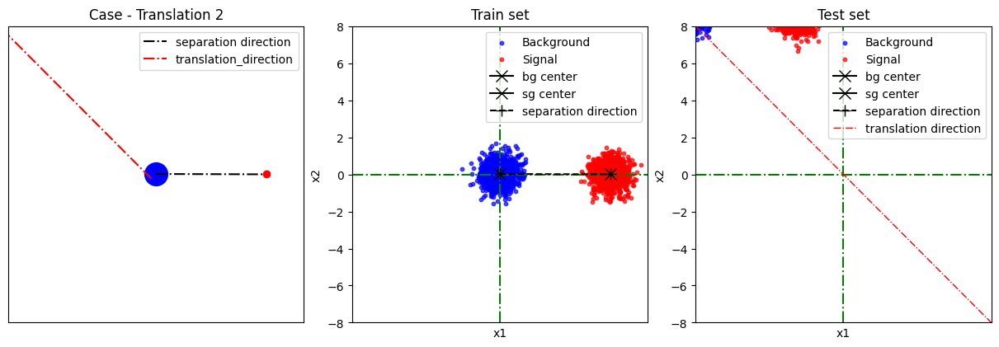

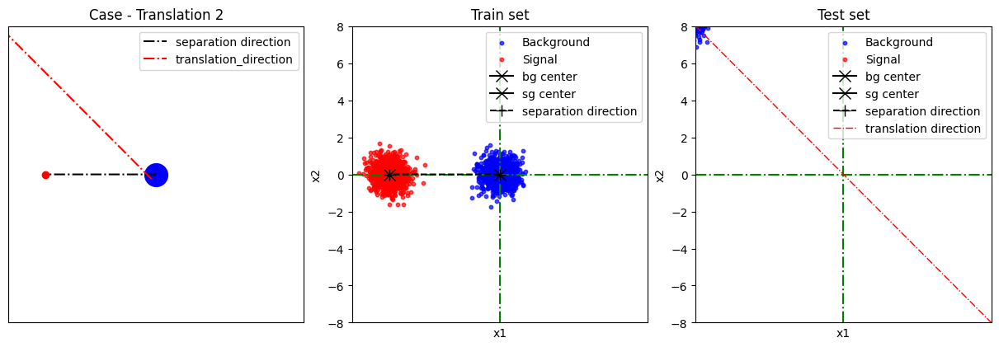

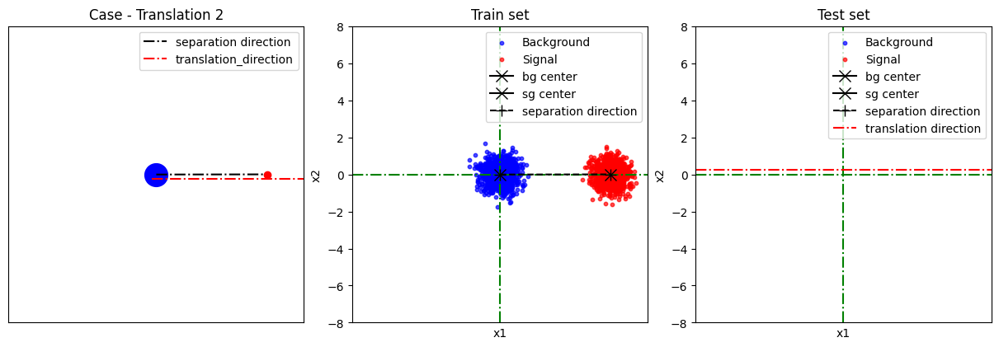

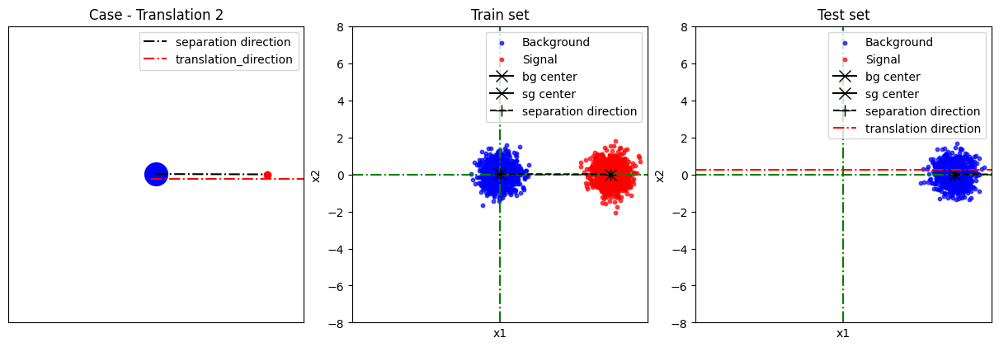

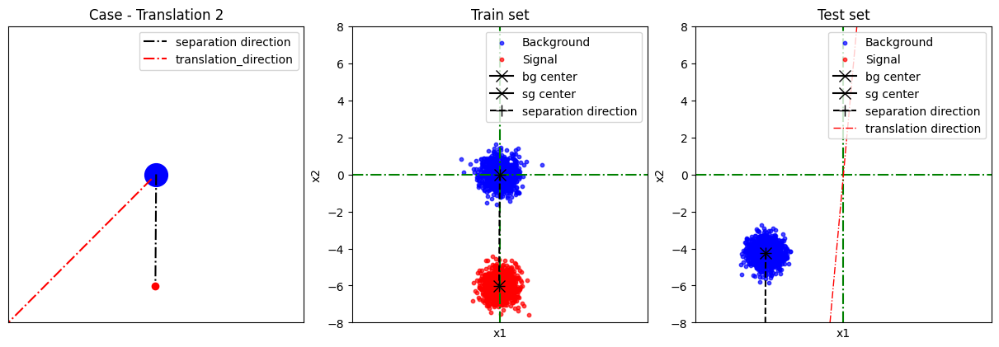

In [9]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])
    #if index == 0:
        #break

## 1.4 - Set parameters for DANN

In [10]:
input_size  = (2,)
hp_lambda = 1.0
num_epochs  = 100
batch_size  = 100
half_batch_size = batch_size // 2
num_source_samples = 2000
num_target_samples = 2000
train_steps_per_epoch = math.ceil(num_source_samples / half_batch_size)
test_steps_per_epoch  = math.ceil(num_target_samples / batch_size)

## 1.5 - Prepare data for DANN

In [11]:
from DANN import set_data_for_DANN,build_datasets_for_DANN

In [12]:
x_sources, y_sources, x_targets, y_targets = set_data_for_DANN (train_sets,test_sets)

In [13]:
training_datasets, testing_datasets = build_datasets_for_DANN (x_sources,y_sources,x_targets,y_targets,settings,num_epochs, batch_size, portion_of_target_for_train=1)

Instructions for updating:
Use `tf.data.Dataset.shuffle(buffer_size, seed)` followed by `tf.data.Dataset.repeat(count)`. Static tf.data optimizations will take care of using the fused implementation.


## 1.6 - Use DANN

In [14]:
from DANN import (build_DANN,
                  compile_DANN,
                  fit_DANN,
                  evaluate_DANN)
from visualize import visualize_DANN_boundaries

Started to work with DANN_1
63/63 [==============================] - 0s 1ms/step


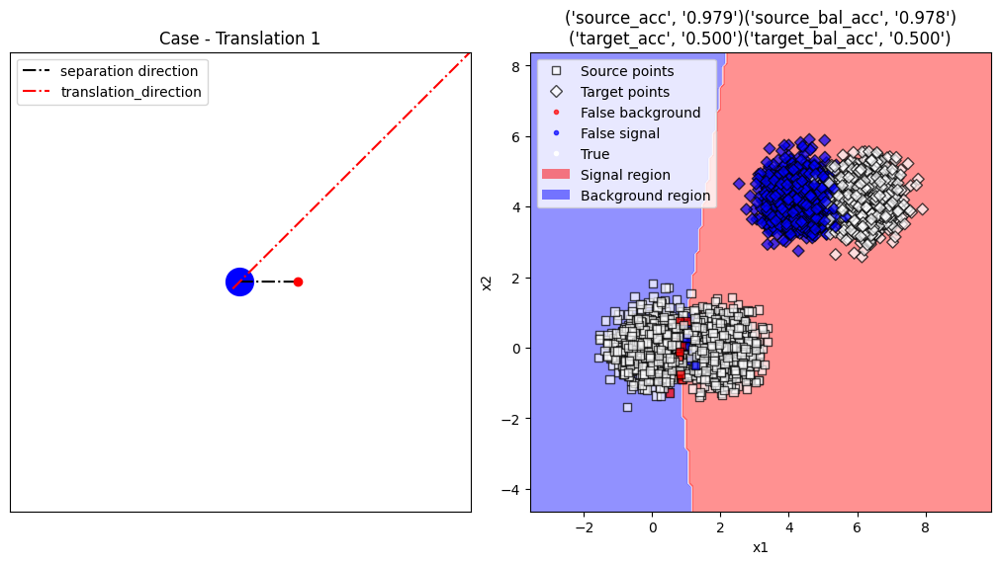

Started to work with DANN_2
63/63 [==============================] - 0s 1ms/step


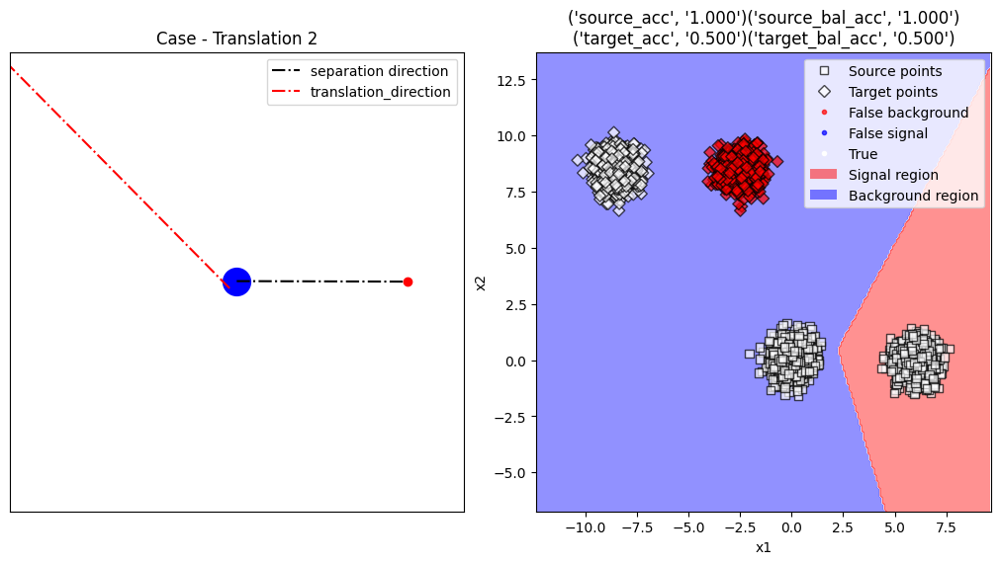

Started to work with DANN_3
63/63 [==============================] - 0s 1ms/step


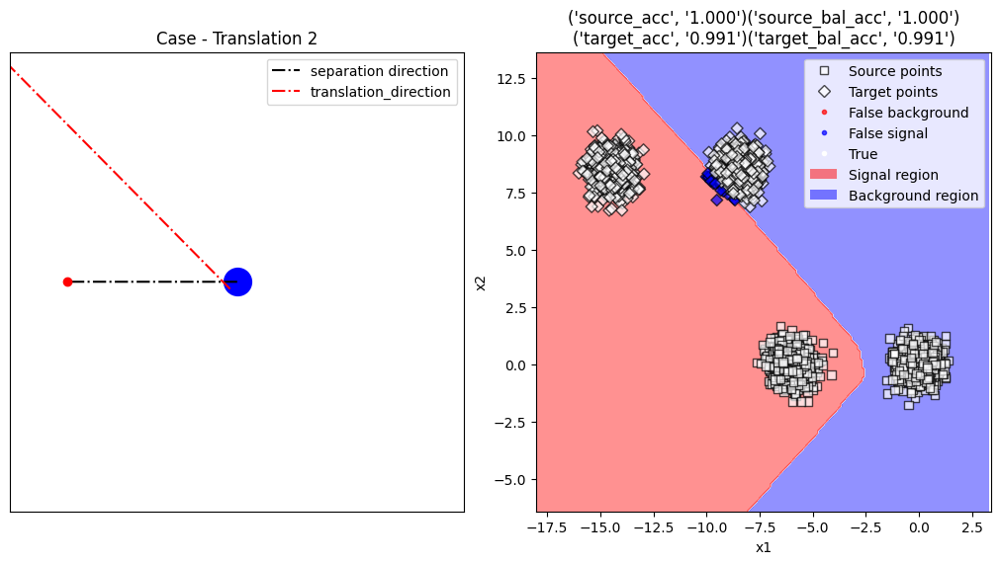

Started to work with DANN_4
63/63 [==============================] - 0s 2ms/step


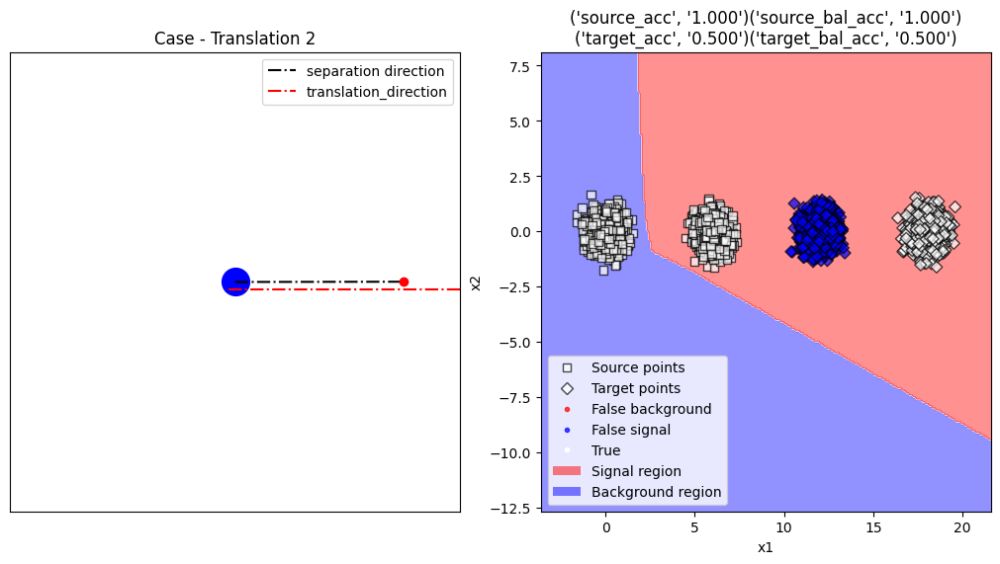

Started to work with DANN_5
63/63 [==============================] - 0s 1ms/step


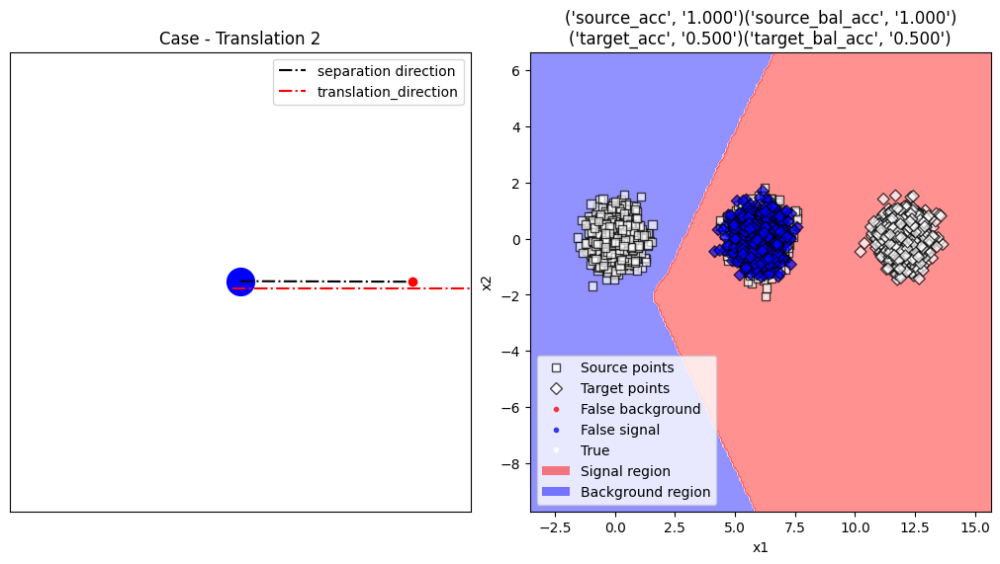

Started to work with DANN_6
63/63 [==============================] - 0s 1ms/step


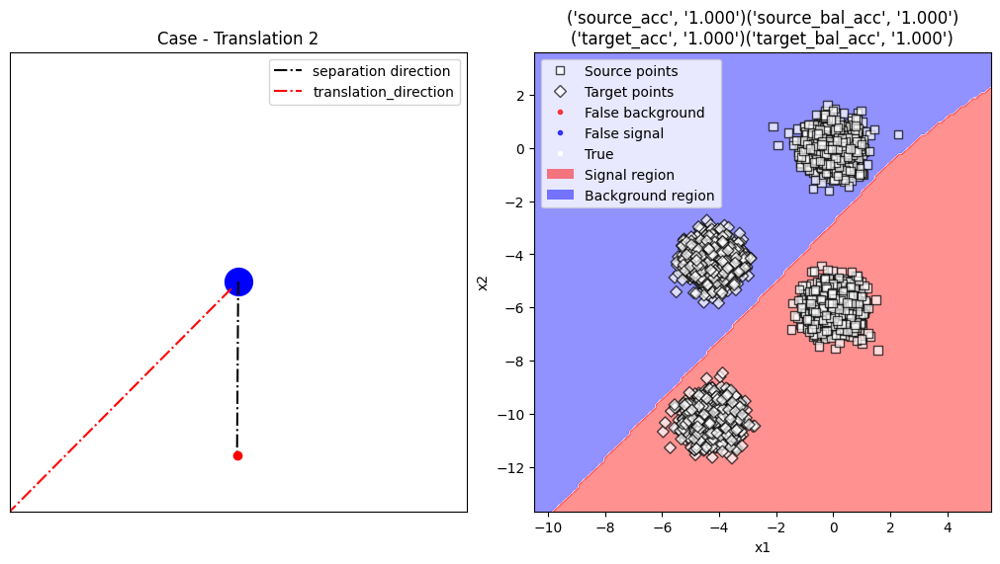

In [15]:
for i,data_pack in enumerate(zip(training_datasets,testing_datasets,x_sources,y_sources,x_targets,y_targets,settings)):
    # Unpack
    training_dataset,testing_dataset,x_source,y_source,x_target,y_target,setting = data_pack
    
    # Build DANN
    DANN_model = build_DANN("DANN_"+str(i+1),input_size,hp_lambda)
    print("Started to work with", DANN_model.name)
    
    # Compile DANN
    compile_DANN(DANN_model)
    
    # Fit DANN
    fit_DANN(DANN_model,training_dataset,testing_dataset,num_epochs,train_steps_per_epoch,test_steps_per_epoch)

    # Evaluate DANN
    results = evaluate_DANN(DANN_model,x_source, y_source, x_target, y_target)
    
    # Visualize DANN
    show_points = True
    visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)

# 2 - Unbalanced Translation

## 2.1 - Generate Data

In [68]:
from data_loader import get_settings_from_json
from data_generator_all_systematics import DataGenerator

In [69]:
data_dir = "DANN_data/Unbalanced_Translation"

In [70]:
data_gen_settings = get_settings_from_json('data_jsons/DANN_jsons/Unbalanced_Translation')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.generate_data()
    data_gen.save_data(directory=data_dir, file_index=index+1)
    

## 2.2 - Load Data

In [71]:
from data_io import load_data, show_data_statistics, write

In [72]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  DANN_data/Unbalanced_Translation
[*] train data dir :  DANN_data/Unbalanced_Translation\train\data
[*] train labels dir :  DANN_data/Unbalanced_Translation\train\labels
[*] test data dir :  DANN_data/Unbalanced_Translation\test\data
[*] test labels dir :  DANN_data/Unbalanced_Translation\test\labels
[*] settings dir :  DANN_data/Unbalanced_Translation\settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




## 2.3 - Visualize Data

In [73]:
from visualize import visualize_data

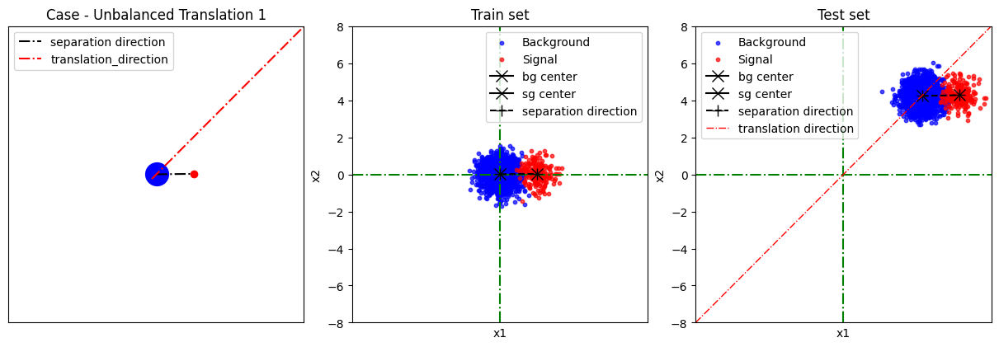

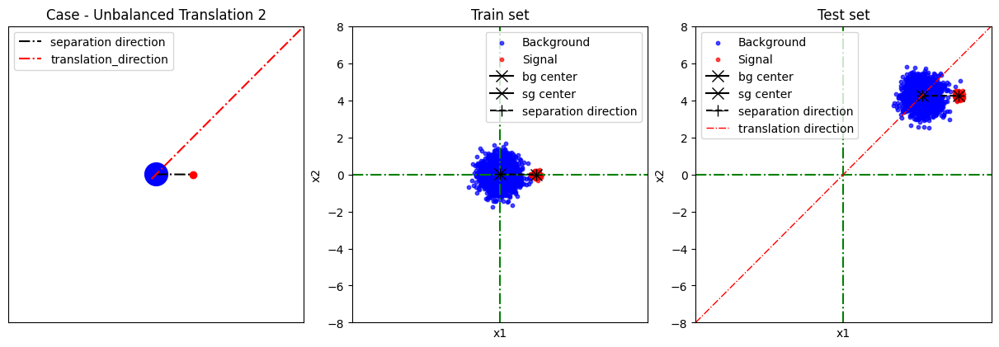

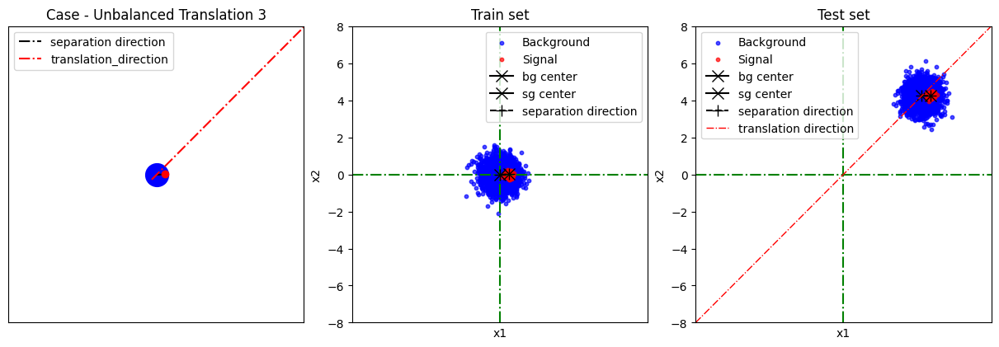

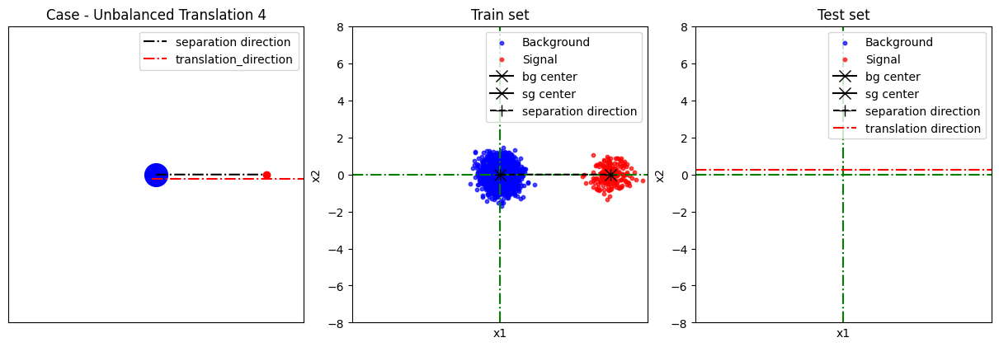

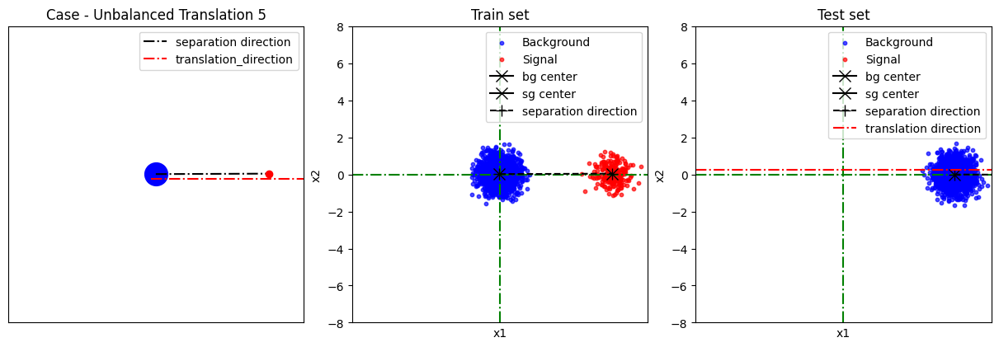

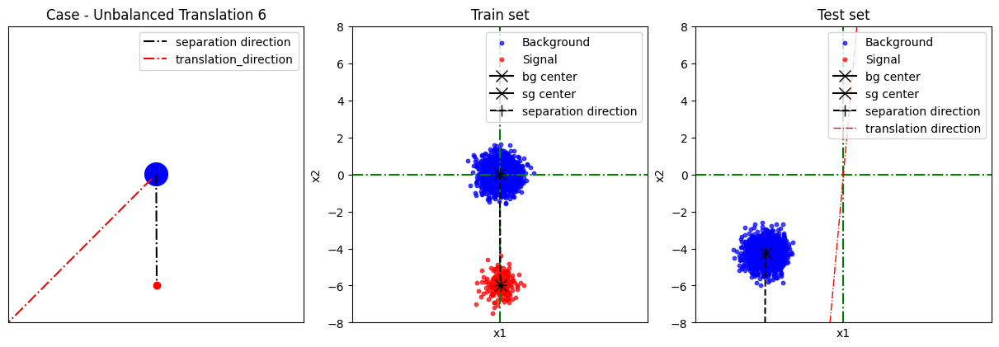

In [74]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])
    #if index == 0:
    #    break

## 2.4 - Set parameters for DANN

In [75]:
input_size  = (2,)
hp_lambda = 1.0
num_epochs  = 100
batch_size  = 100
half_batch_size = batch_size // 2
num_source_samples = 2000
num_target_samples = 2000
train_steps_per_epoch = math.ceil(num_source_samples / half_batch_size)
test_steps_per_epoch  = math.ceil(num_target_samples / batch_size)

## 2.5 - Prepare data for DANN

In [76]:
from DANN import set_data_for_DANN,build_datasets_for_DANN

In [77]:
x_sources, y_sources, x_targets, y_targets = set_data_for_DANN (train_sets,test_sets)

In [78]:
training_datasets, testing_datasets = build_datasets_for_DANN (x_sources,y_sources,x_targets,y_targets,settings,num_epochs, batch_size, portion_of_target_for_train=1)

## 2.6 - Use DANN

In [79]:
from DANN import (build_DANN,
                  compile_DANN,
                  fit_DANN,
                  evaluate_DANN)
from visualize import visualize_DANN_boundaries

Started to work with DANN_1
66/66 [==============================] - 0s 1ms/step


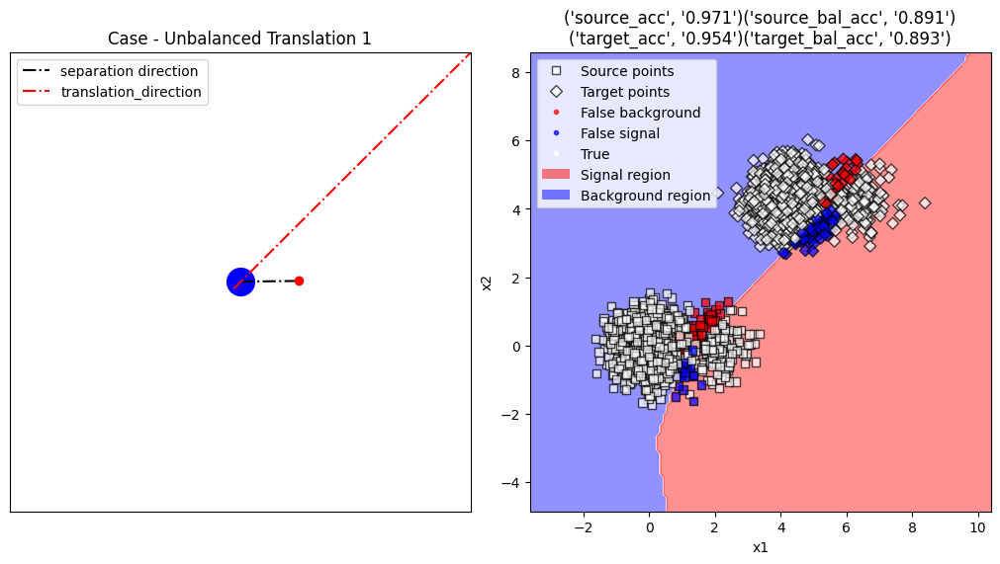

Started to work with DANN_2
66/66 [==============================] - 0s 1ms/step


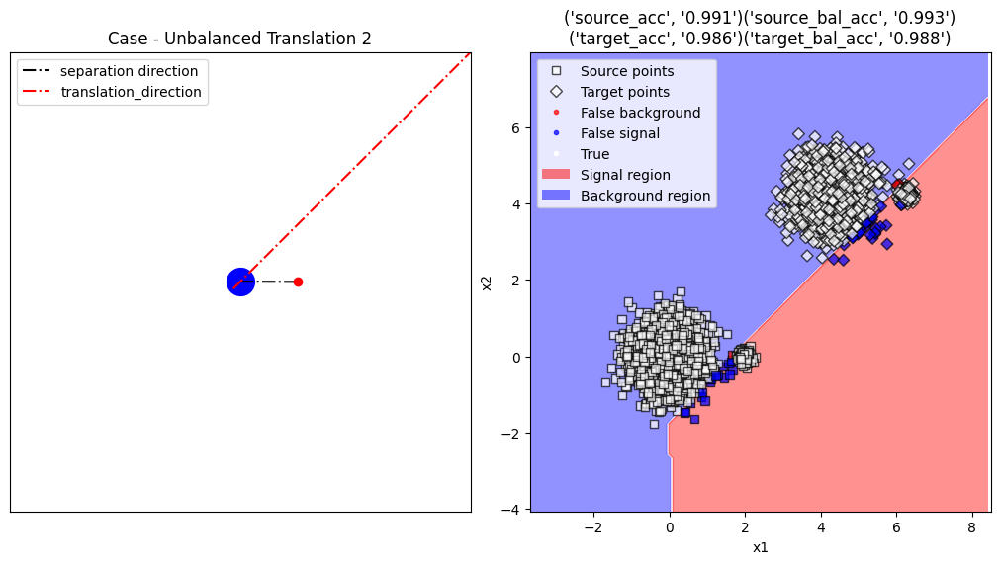

Started to work with DANN_3
66/66 [==============================] - 0s 1ms/step


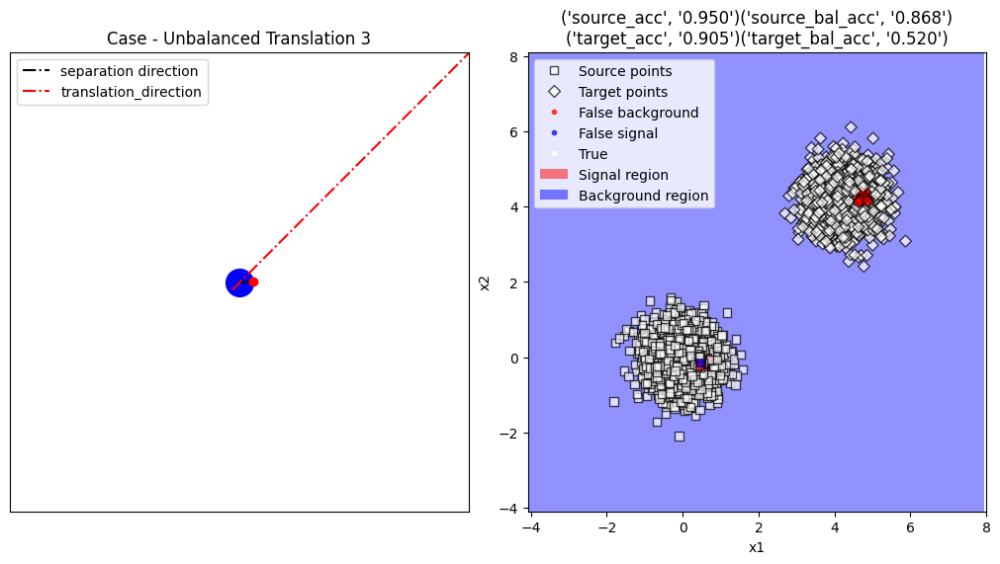

466/466 [==============================] - 1s 1ms/step


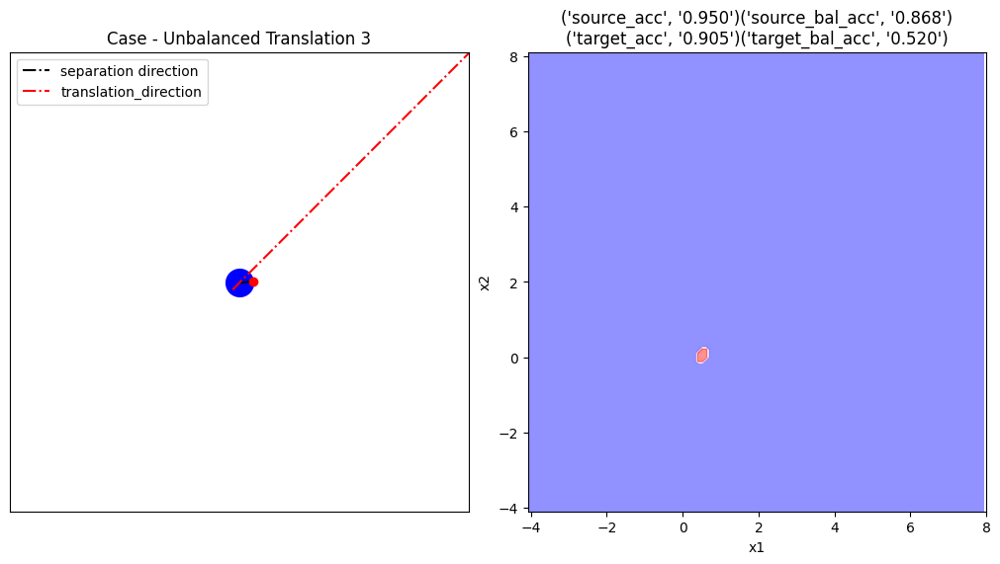

Started to work with DANN_4
66/66 [==============================] - 0s 1ms/step


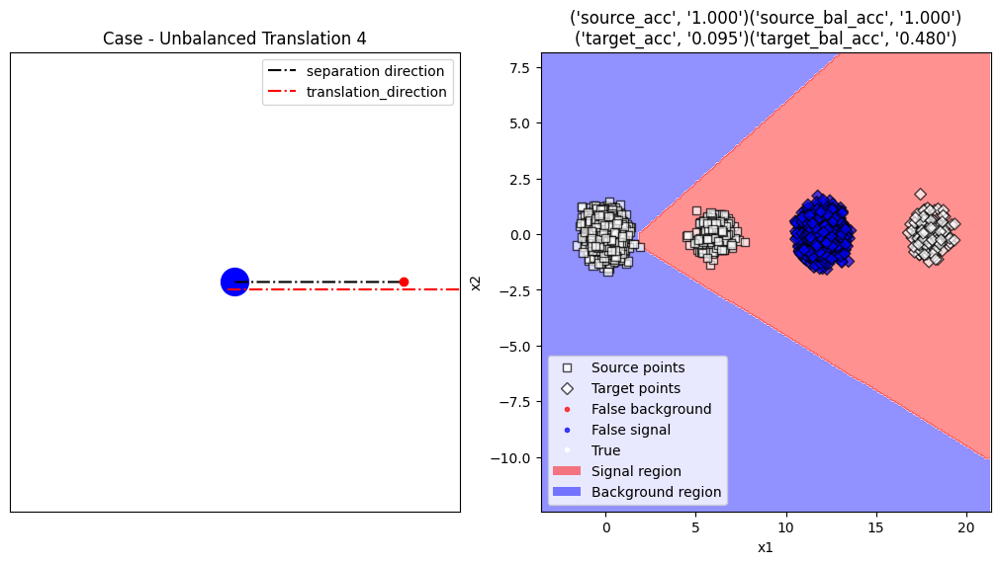

Started to work with DANN_5
66/66 [==============================] - 0s 1ms/step


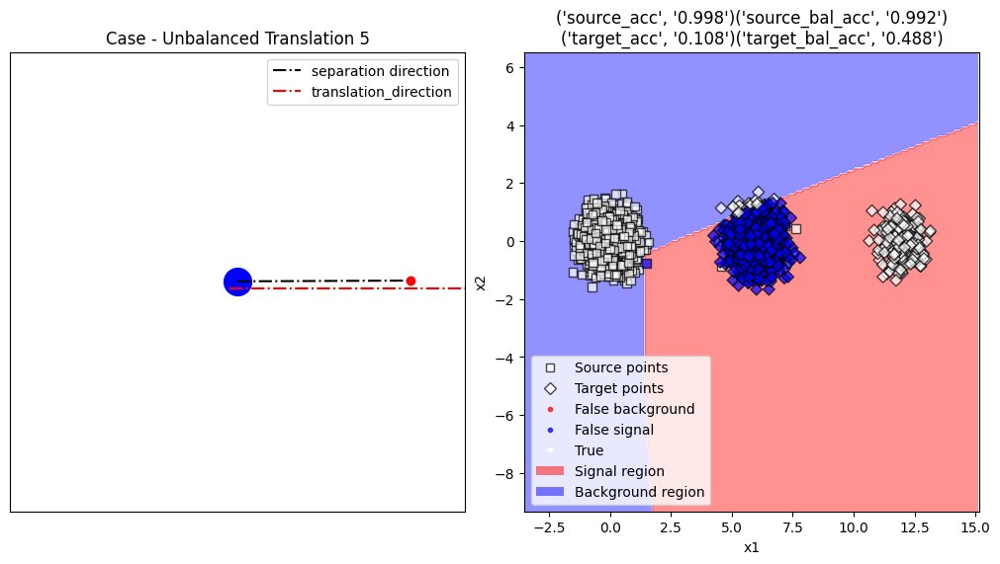

Started to work with DANN_6
66/66 [==============================] - 0s 1ms/step


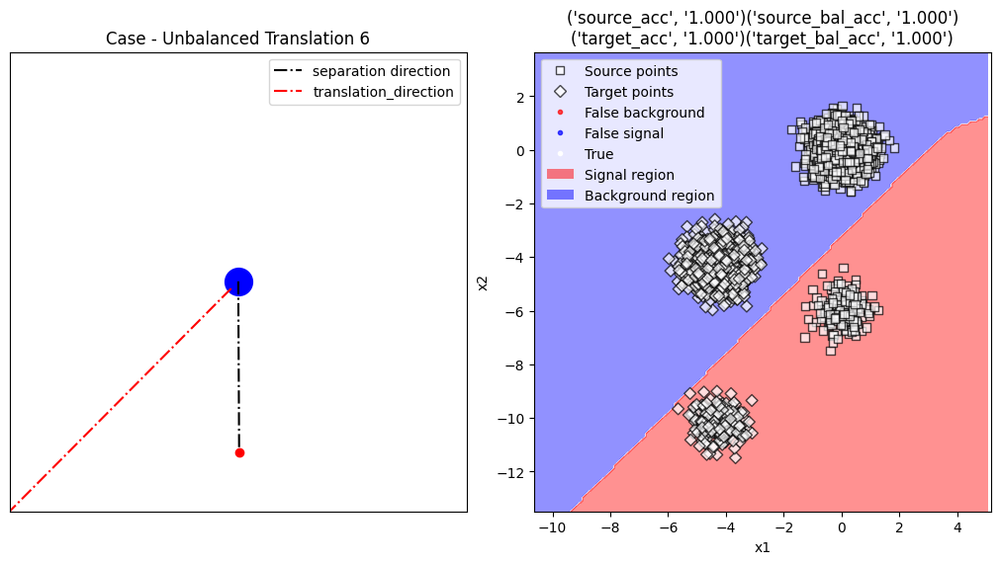

In [80]:
for i,data_pack in enumerate(zip(training_datasets,testing_datasets,x_sources,y_sources,x_targets,y_targets,settings)):
    # Unpack
    training_dataset,testing_dataset,x_source,y_source,x_target,y_target,setting = data_pack
    
    # Build DANN
    DANN_model = build_DANN("DANN_"+str(i+1),input_size,hp_lambda)
    print("Started to work with", DANN_model.name)
    
    # Compile DANN
    compile_DANN(DANN_model)
    
    # Fit DANN
    fit_DANN(DANN_model,training_dataset,testing_dataset,num_epochs,train_steps_per_epoch,test_steps_per_epoch)

    # Evaluate DANN
    results = evaluate_DANN(DANN_model,x_source, y_source, x_target, y_target)
    
    # Visualize DANN
    show_points = True
    visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)
    if i==2 :
        show_points = False
        visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)

# 3 - Scaled Translation

## 3.1 - Generate Data

In [29]:
from data_loader import get_settings_from_json
from data_generator_all_systematics import DataGenerator

In [30]:
data_dir = "DANN_data/Scaling"

In [31]:
data_gen_settings = get_settings_from_json('data_jsons/DANN_jsons/Scaling')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.generate_data()
    data_gen.save_data(directory=data_dir, file_index=index+1)
    

## 3.2 - Load Data

In [32]:
from data_io import load_data, show_data_statistics, write

In [33]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  DANN_data/Scaling
[*] train data dir :  DANN_data/Scaling\train\data
[*] train labels dir :  DANN_data/Scaling\train\labels
[*] test data dir :  DANN_data/Scaling\test\data
[*] test labels dir :  DANN_data/Scaling\test\labels
[*] settings dir :  DANN_data/Scaling\settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




## 3.3 - Visualize Data

In [34]:
from visualize import visualize_data

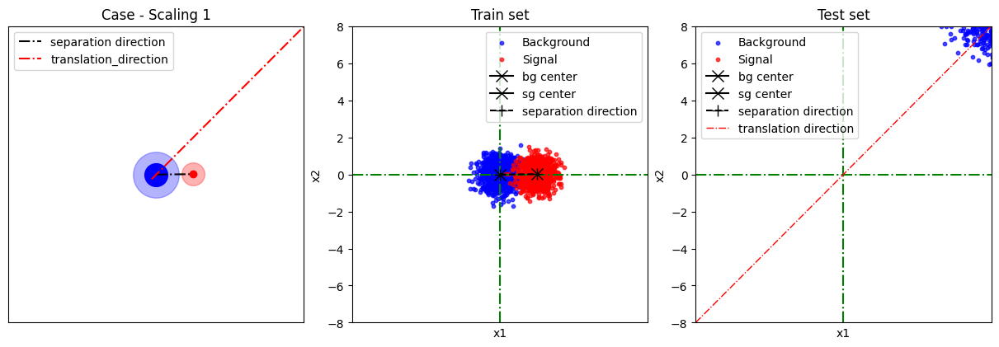

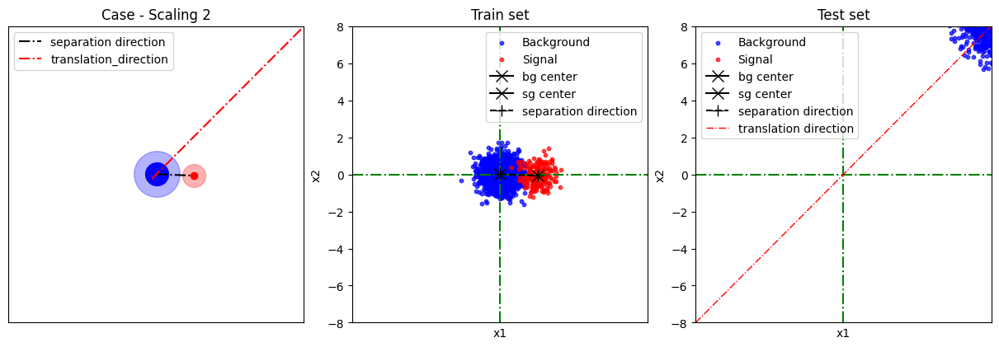

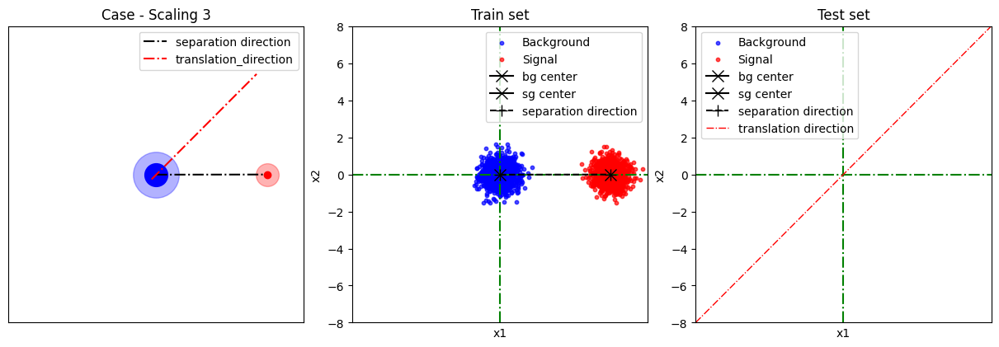

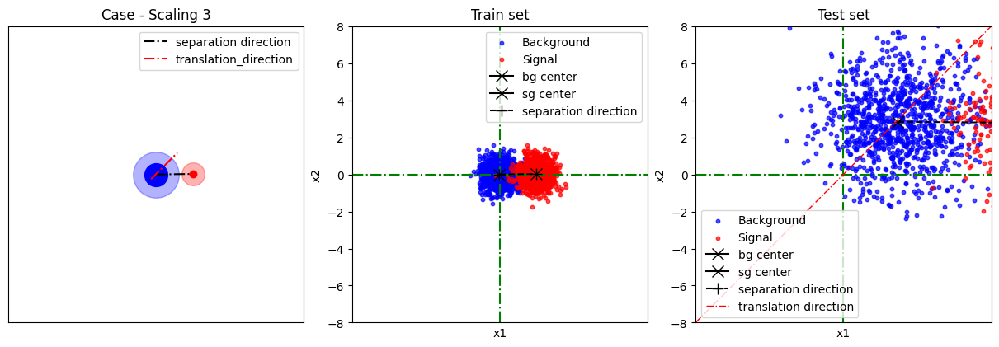

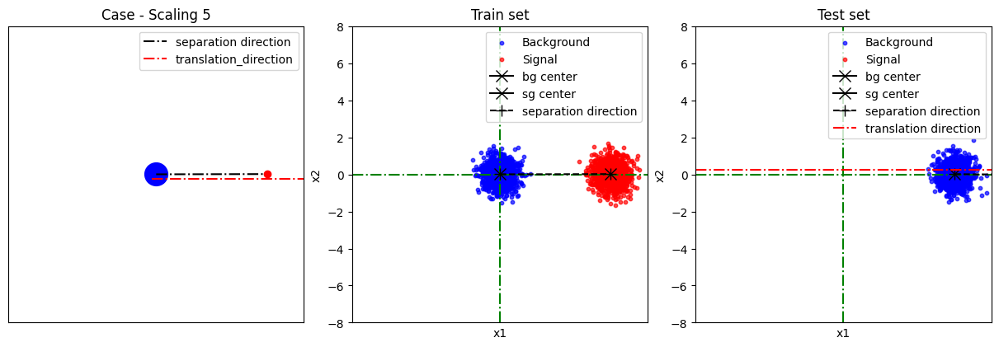

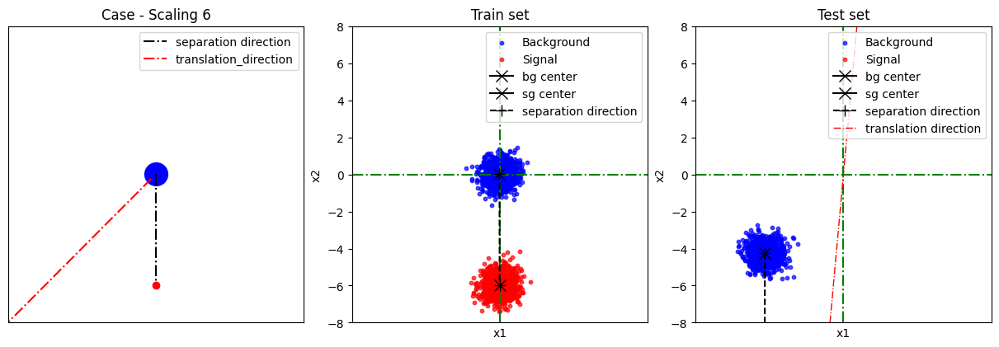

In [35]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])
    #if index == 0:
    #    break

## 3.4 - Set parameters for DANN

In [36]:
input_size  = (2,)
hp_lambda = 1.0
num_epochs  = 100
batch_size  = 100
half_batch_size = batch_size // 2
num_source_samples = 2000
num_target_samples = 2000
train_steps_per_epoch = math.ceil(num_source_samples / half_batch_size)
test_steps_per_epoch  = math.ceil(num_target_samples / batch_size)

## 3.5 - Prepare data for DANN

In [37]:
from DANN import set_data_for_DANN,build_datasets_for_DANN

In [38]:
x_sources, y_sources, x_targets, y_targets = set_data_for_DANN (train_sets,test_sets)

In [39]:
training_datasets, testing_datasets = build_datasets_for_DANN (x_sources,y_sources,x_targets,y_targets,settings,num_epochs, batch_size, portion_of_target_for_train=1)

## 3.6 - Use DANN

In [40]:
from DANN import (build_DANN,
                  compile_DANN,
                  fit_DANN,
                  evaluate_DANN)
from visualize import visualize_DANN_boundaries

Started to work with DANN_1
63/63 [==============================] - 0s 1ms/step


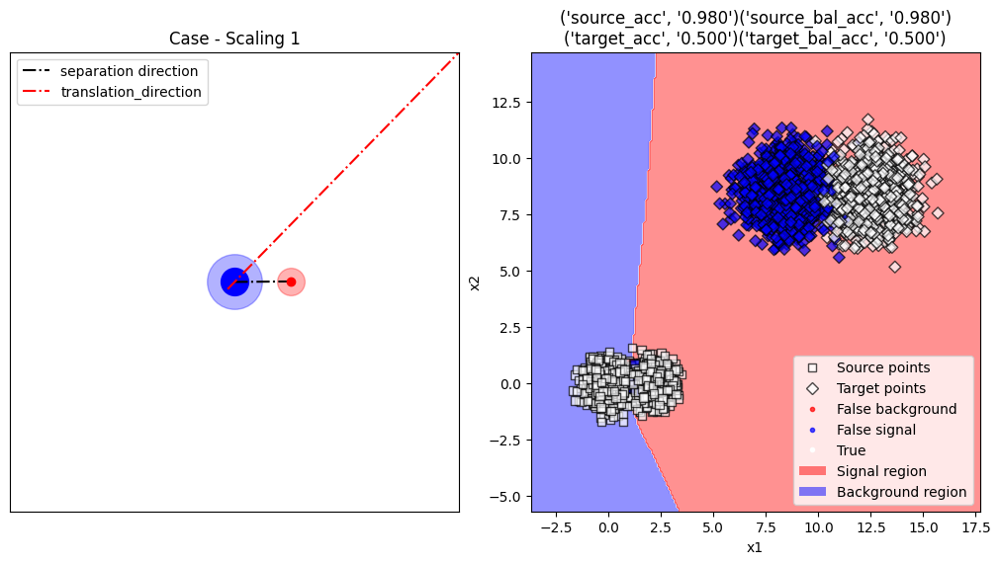

Started to work with DANN_2
66/66 [==============================] - 0s 1ms/step


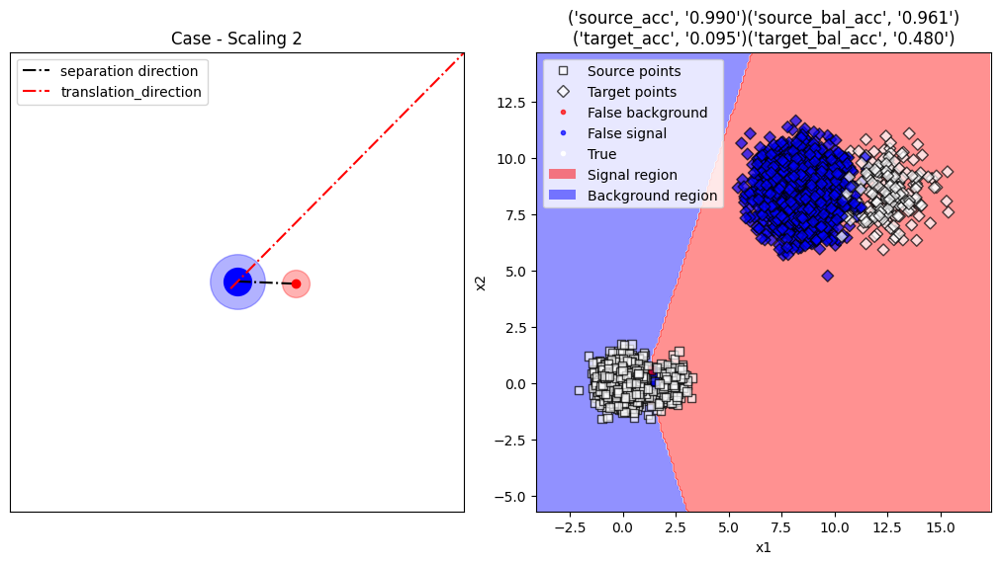

Started to work with DANN_3
63/63 [==============================] - 0s 1ms/step


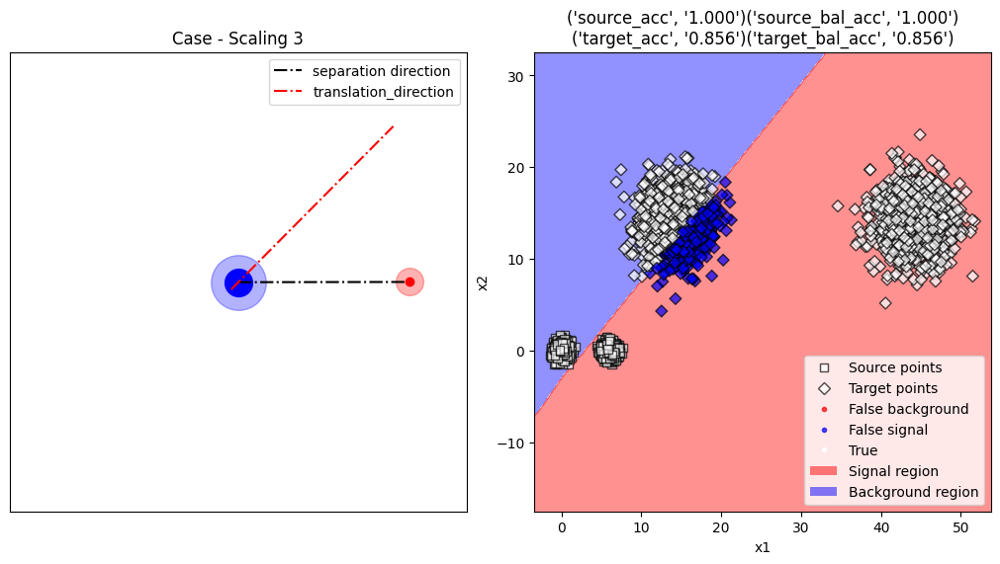

Started to work with DANN_4
63/63 [==============================] - 0s 1ms/step


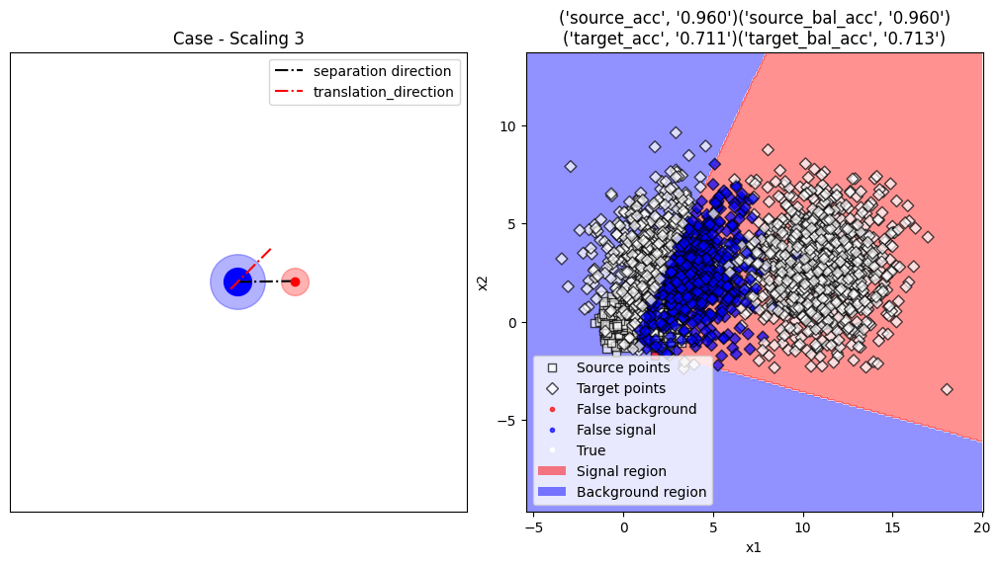

Started to work with DANN_5
63/63 [==============================] - 0s 1ms/step


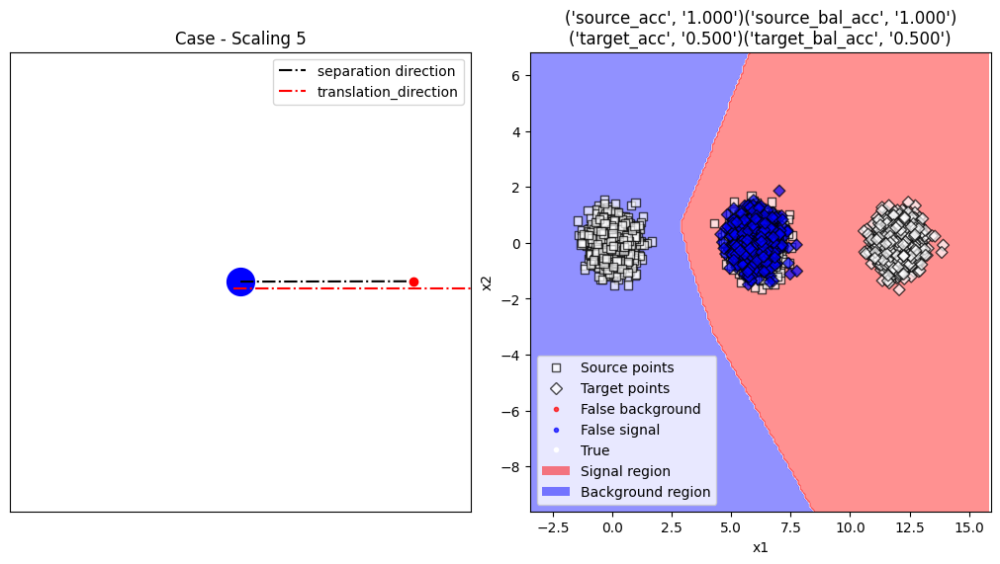

Started to work with DANN_6
63/63 [==============================] - 0s 1ms/step


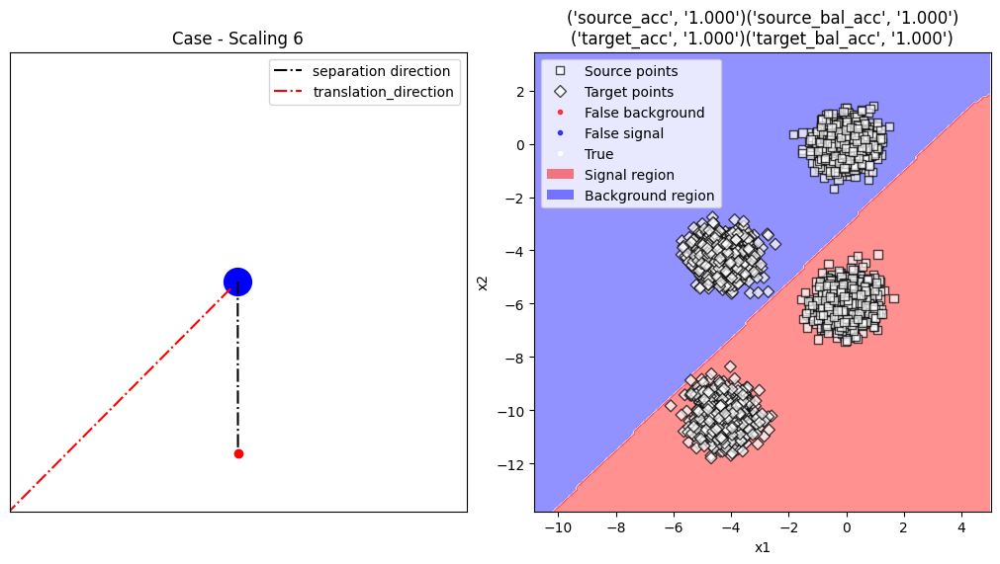

In [41]:
for i,data_pack in enumerate(zip(training_datasets,testing_datasets,x_sources,y_sources,x_targets,y_targets,settings)):
    # Unpack
    training_dataset,testing_dataset,x_source,y_source,x_target,y_target,setting = data_pack
    
    # Build DANN
    DANN_model = build_DANN("DANN_"+str(i+1),input_size,hp_lambda)
    print("Started to work with", DANN_model.name)
    
    # Compile DANN
    compile_DANN(DANN_model)
    
    # Fit DANN
    fit_DANN(DANN_model,training_dataset,testing_dataset,num_epochs,train_steps_per_epoch,test_steps_per_epoch)

    # Evaluate DANN
    results = evaluate_DANN(DANN_model,x_source, y_source, x_target, y_target)
    
    # Visualize DANN
    show_points = True
    visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)

# 4 - All systematics normal Gaussian

## 4.1 - Generate Data

In [42]:
from data_loader import get_settings_from_json
from data_generator_all_systematics import DataGenerator

In [43]:
data_dir = "DANN_data/all_systematics_normal_gaussian"

In [44]:
data_gen_settings = get_settings_from_json('data_jsons/all_systematics_normal_gaussian')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.generate_data()
    data_gen.save_data(directory=data_dir, file_index=index+1)
    

## 4.2 - Load Data

In [45]:
from data_io import load_data, show_data_statistics, write

In [46]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  DANN_data/all_systematics_normal_gaussian
[*] train data dir :  DANN_data/all_systematics_normal_gaussian\train\data
[*] train labels dir :  DANN_data/all_systematics_normal_gaussian\train\labels
[*] test data dir :  DANN_data/all_systematics_normal_gaussian\test\data
[*] test labels dir :  DANN_data/all_systematics_normal_gaussian\test\labels
[*] settings dir :  DANN_data/all_systematics_normal_gaussian\settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 12 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




## 4.3 - Visualize Data

In [47]:
from visualize import visualize_data

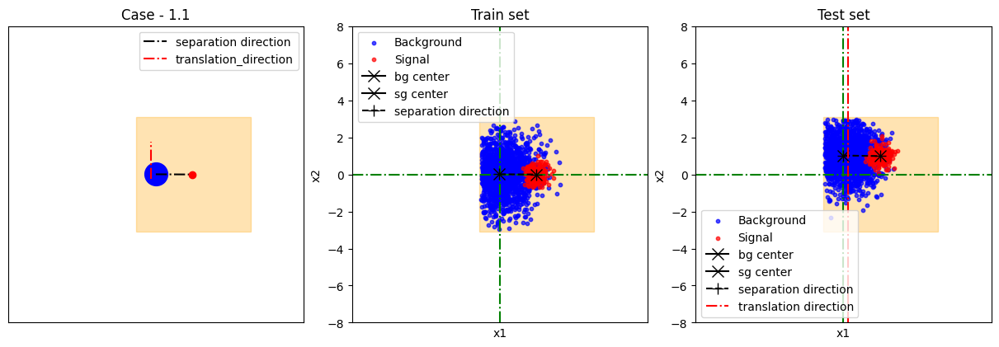

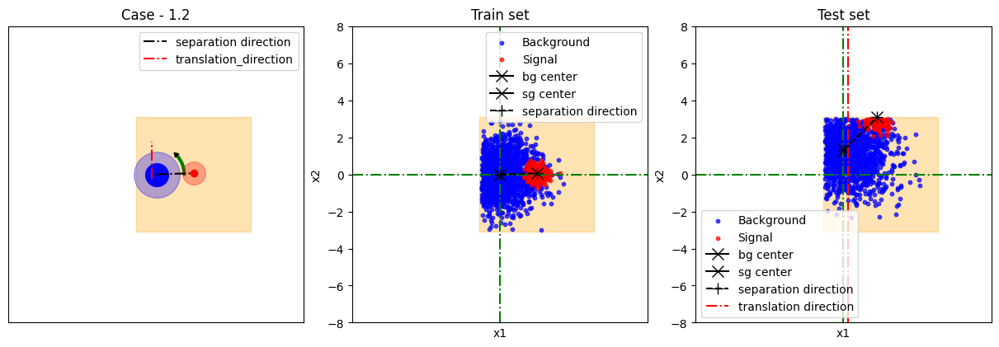

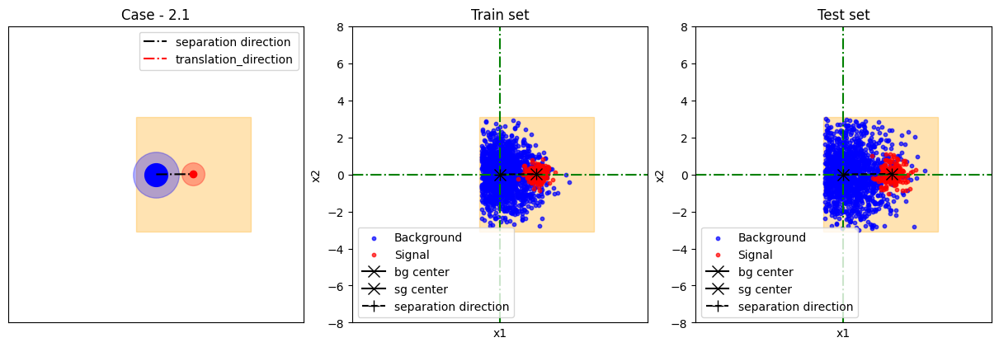

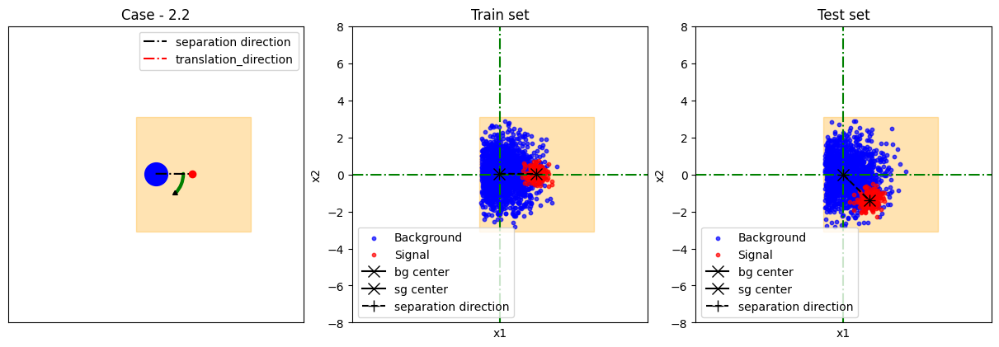

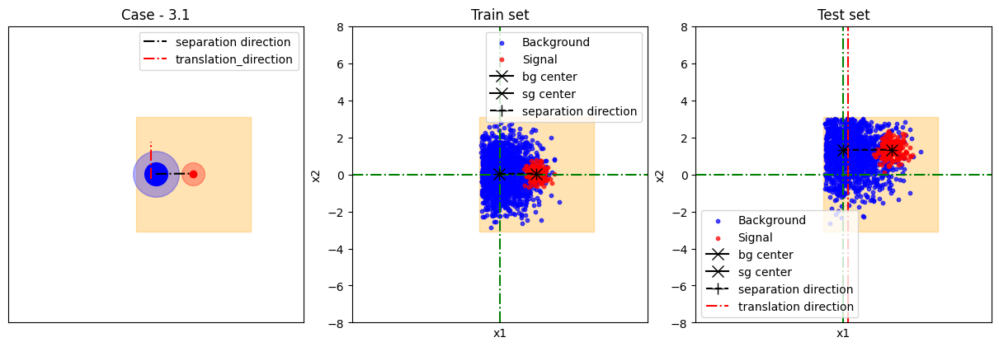

...

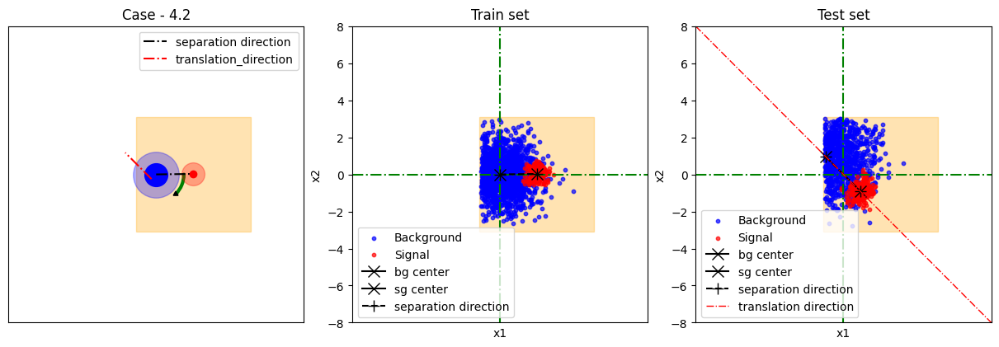

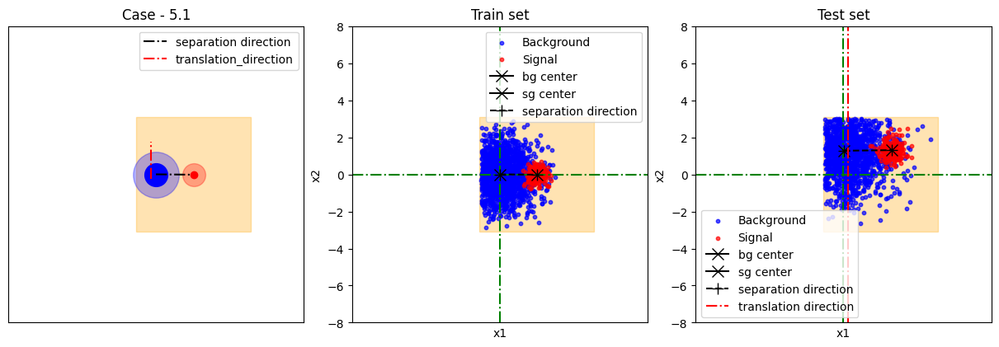

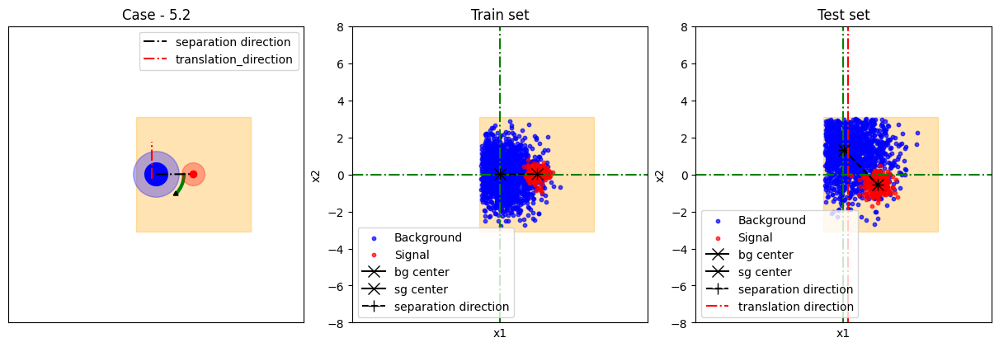

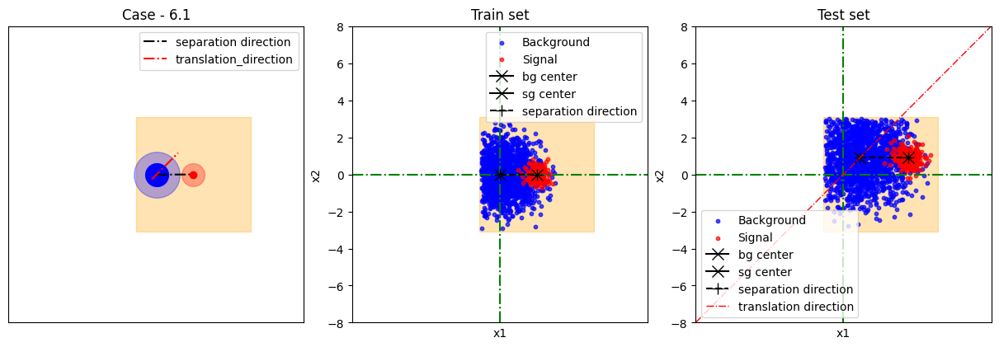

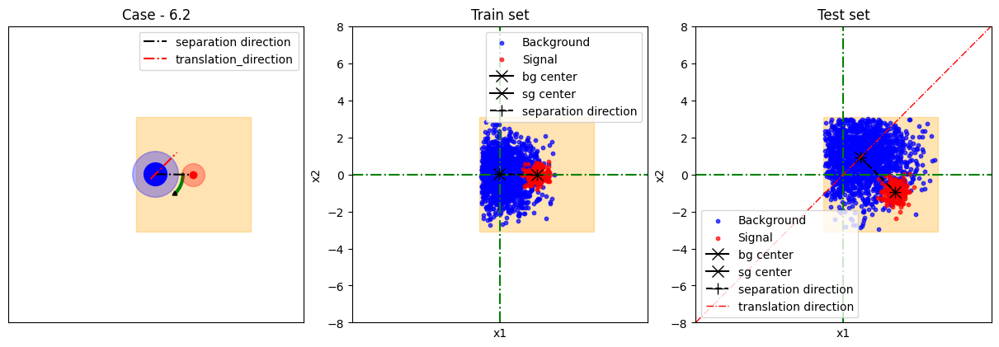

In [48]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])
    #if index == 0:
    #    break

## 4.4 - Set parameters for DANN

In [49]:
input_size  = (2,)
hp_lambda = 1.0
num_epochs  = 100
batch_size  = 100
half_batch_size = batch_size // 2
num_source_samples = 2000
num_target_samples = 2000
train_steps_per_epoch = math.ceil(num_source_samples / half_batch_size)
test_steps_per_epoch  = math.ceil(num_target_samples / batch_size)

## 4.5 - Prepare data for DANN

In [50]:
from DANN import set_data_for_DANN,build_datasets_for_DANN

In [51]:
x_sources, y_sources, x_targets, y_targets = set_data_for_DANN (train_sets,test_sets)

In [52]:
training_datasets, testing_datasets = build_datasets_for_DANN (x_sources,y_sources,x_targets,y_targets,settings,num_epochs, batch_size, portion_of_target_for_train=1)

## 4.6 - Use DANN

In [53]:
from DANN import (build_DANN,
                  compile_DANN,
                  fit_DANN,
                  evaluate_DANN)
from visualize import visualize_DANN_boundaries

Started to work with DANN_1
53/53 [==============================] - 0s 1ms/step


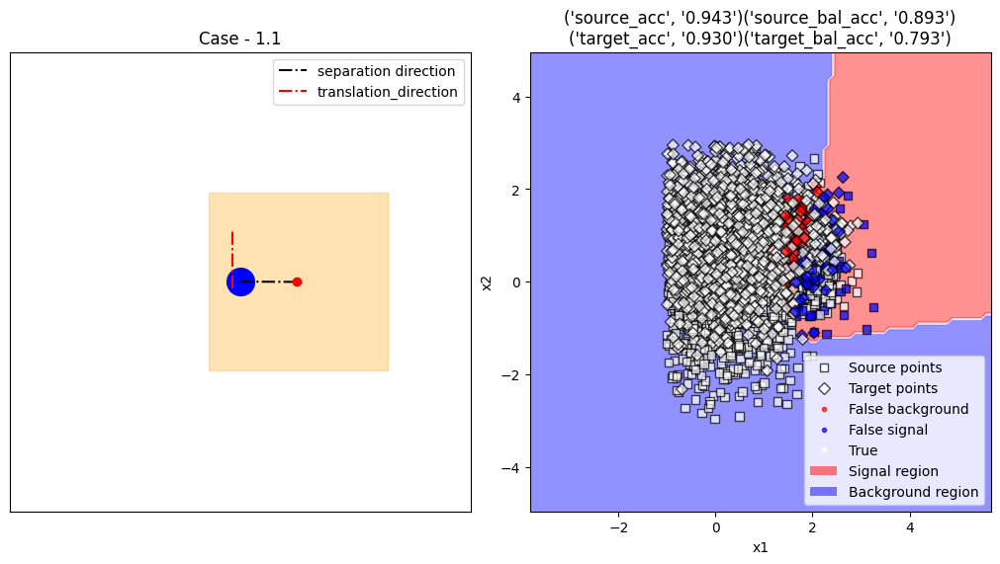

Started to work with DANN_2
43/43 [==============================] - 0s 935us/step


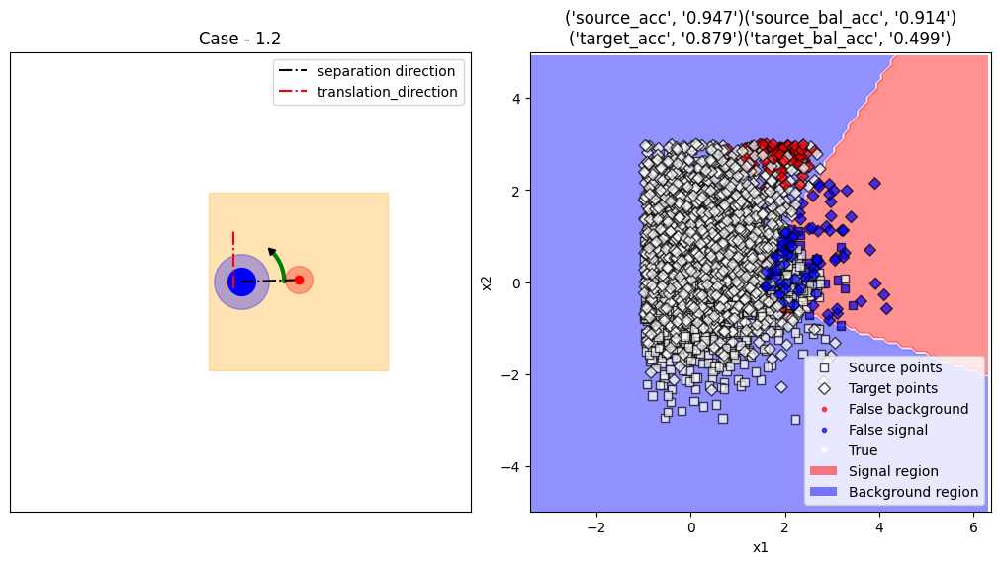

Started to work with DANN_3
49/49 [==============================] - 0s 964us/step


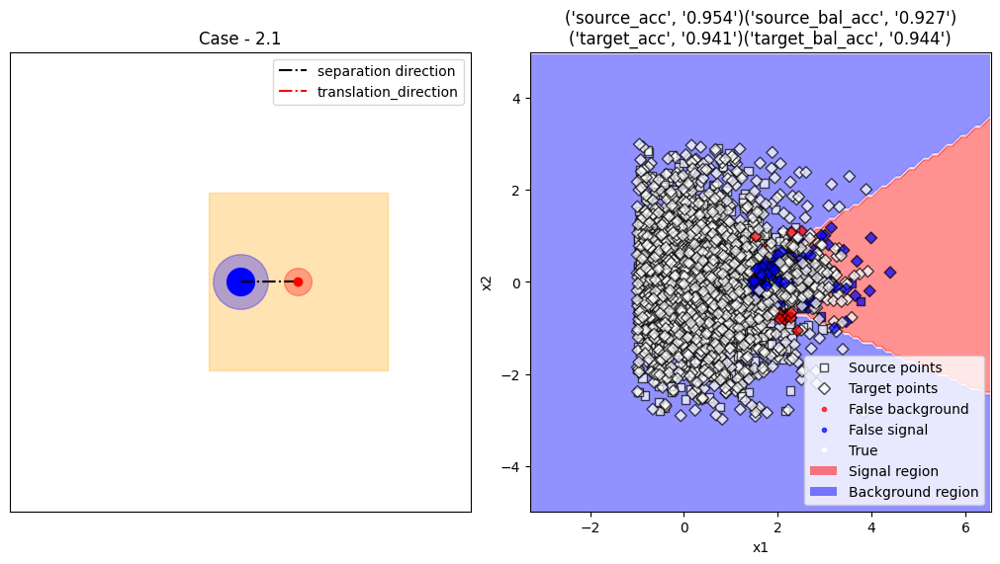

Started to work with DANN_4
54/54 [==============================] - 0s 1ms/step


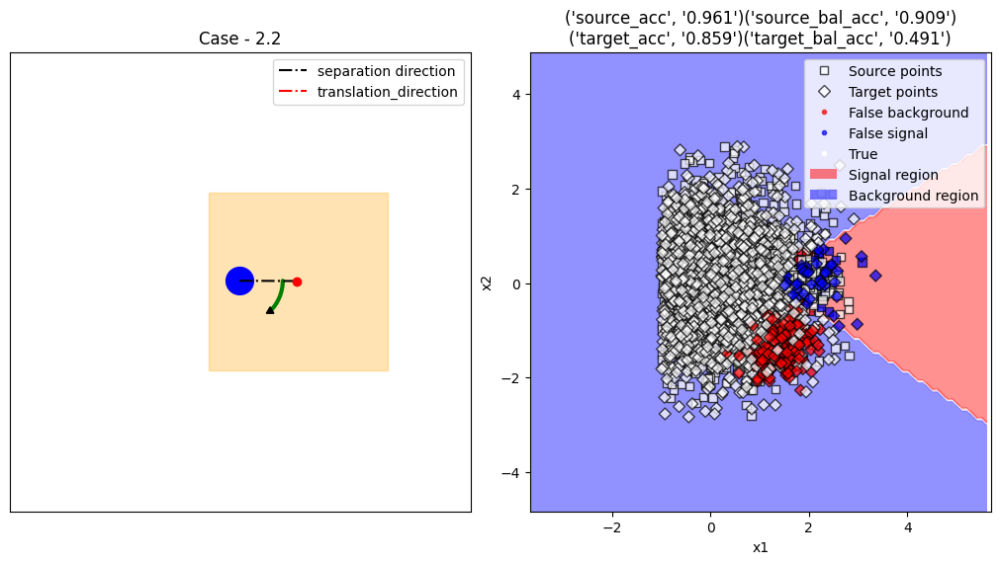

Started to work with DANN_5
46/46 [==============================] - 0s 1ms/step


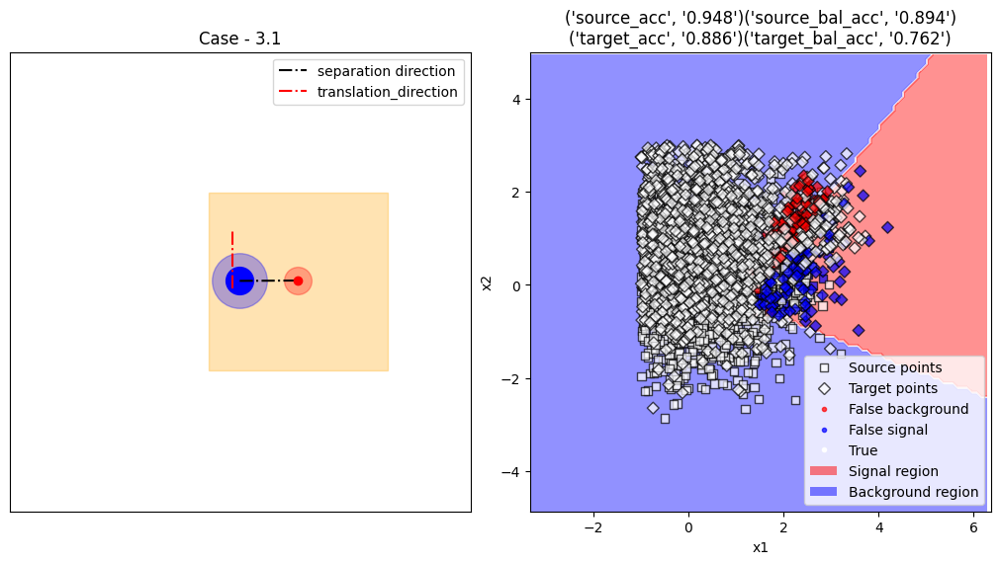

Started to work with DANN_6
47/47 [==============================] - 0s 886us/step


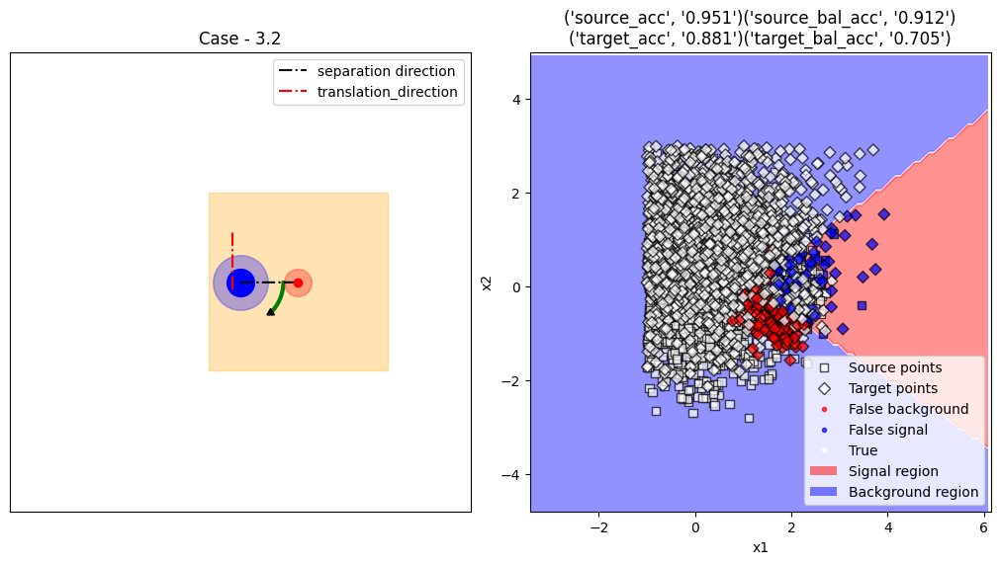

Started to work with DANN_7
34/34 [==============================] - 0s 950us/step


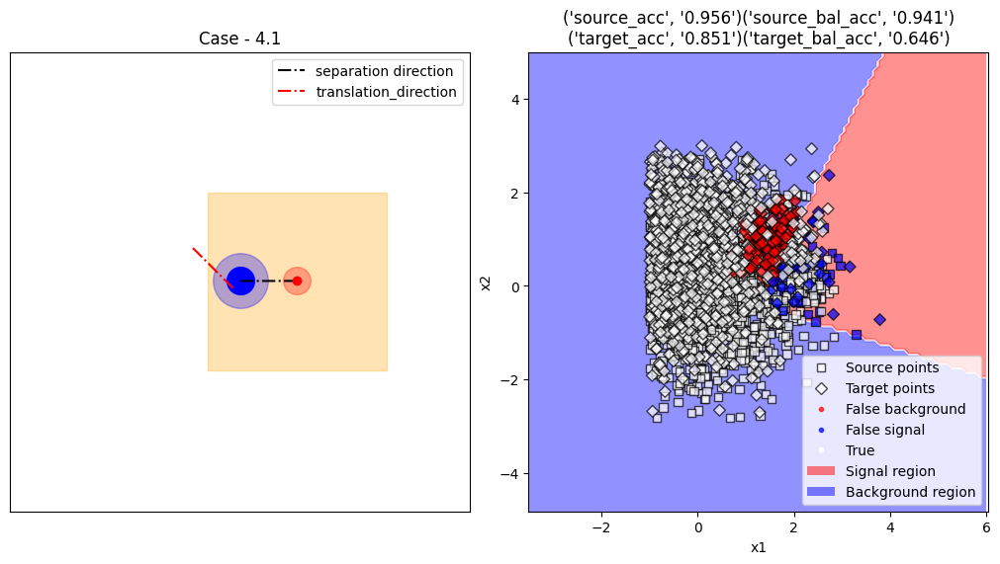

Started to work with DANN_8
34/34 [==============================] - 0s 488us/step


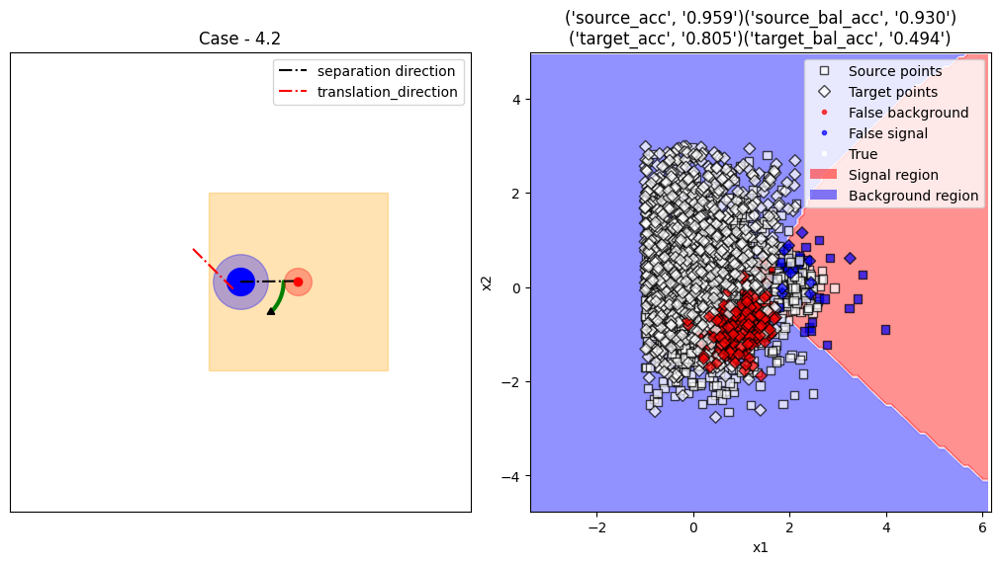

Started to work with DANN_9
46/46 [==============================] - 0s 1ms/step


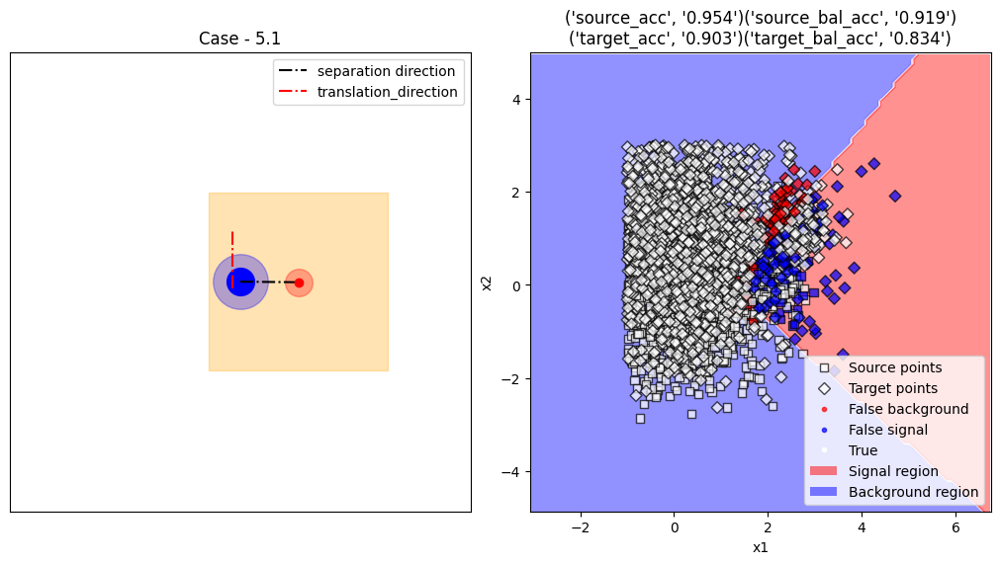

Started to work with DANN_10
47/47 [==============================] - 0s 1ms/step


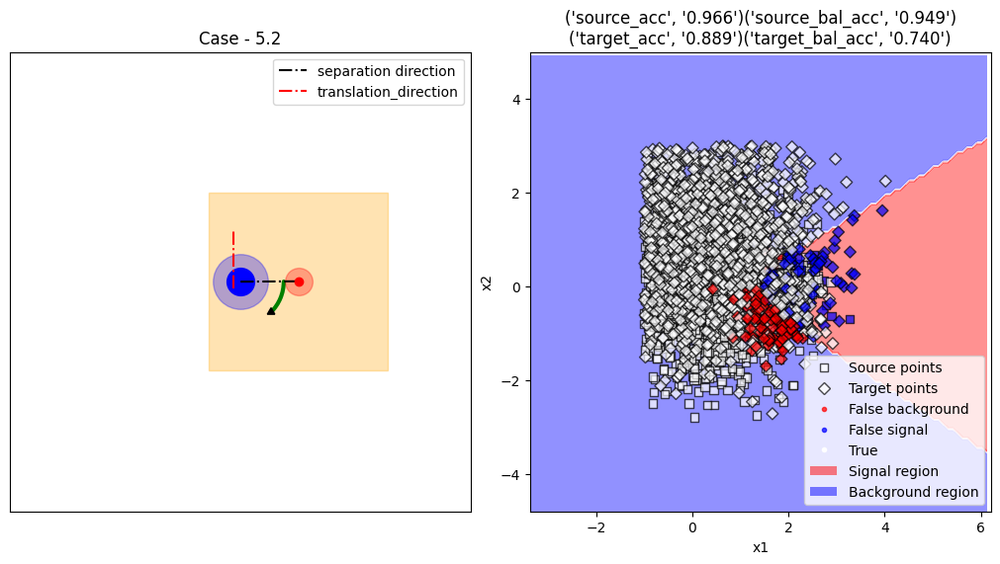

Started to work with DANN_11
56/56 [==============================] - 0s 1ms/step


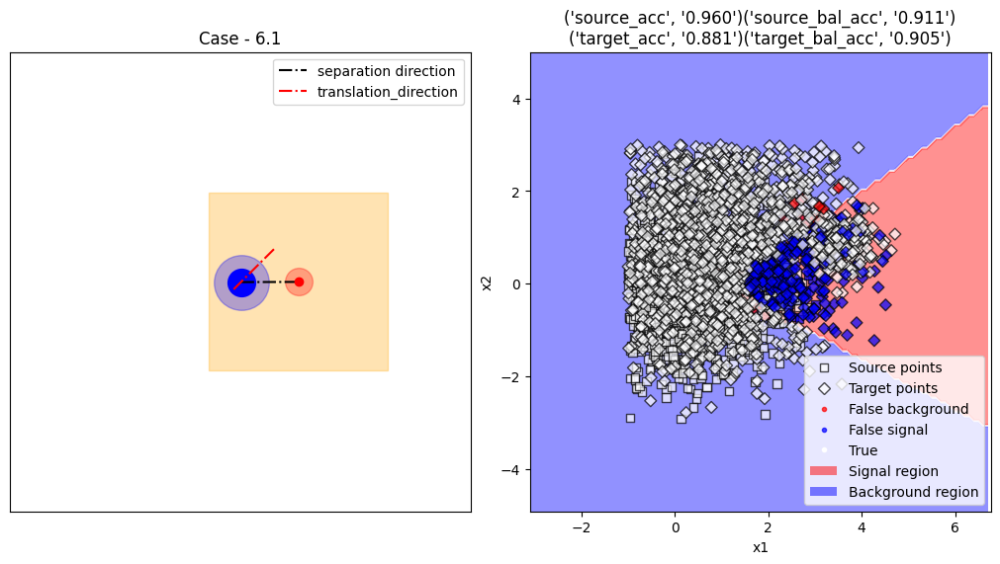

Started to work with DANN_12
56/56 [==============================] - 0s 1ms/step


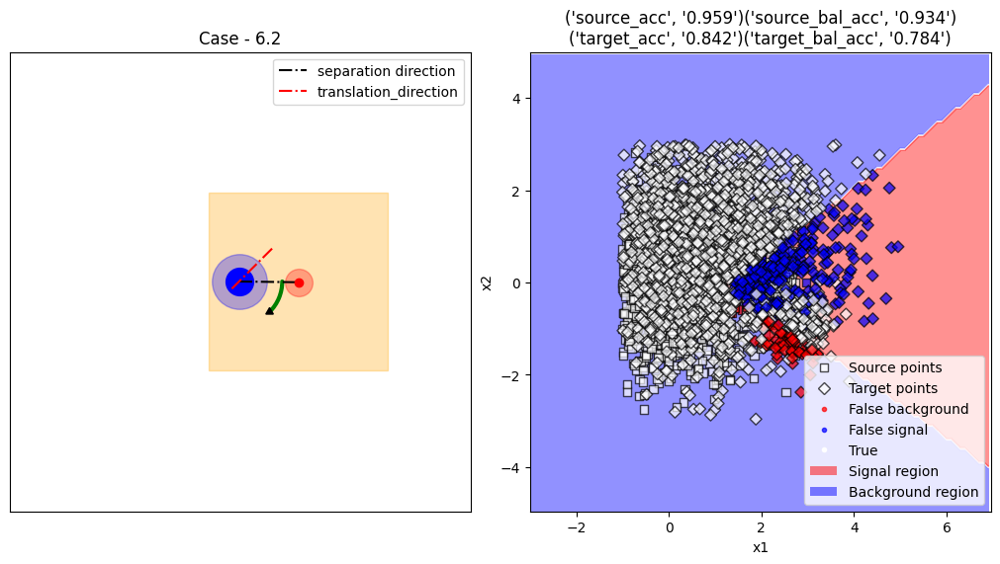

In [54]:
for i,data_pack in enumerate(zip(training_datasets,testing_datasets,x_sources,y_sources,x_targets,y_targets,settings)):
    # Unpack
    training_dataset,testing_dataset,x_source,y_source,x_target,y_target,setting = data_pack
    
    # Build DANN
    DANN_model = build_DANN("DANN_"+str(i+1),input_size,hp_lambda)
    print("Started to work with", DANN_model.name)
    
    # Compile DANN
    compile_DANN(DANN_model)
    
    # Fit DANN
    fit_DANN(DANN_model,training_dataset,testing_dataset,num_epochs,train_steps_per_epoch,test_steps_per_epoch)

    # Evaluate DANN
    results = evaluate_DANN(DANN_model,x_source, y_source, x_target, y_target)
    
    # Visualize DANN
    show_points = True
    visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)

# 5 - All systematics normal Gamma

## 5.1 - Generate Data

In [55]:
from data_loader import get_settings_from_json
from data_generator_all_systematics import DataGenerator

In [56]:
data_dir = "DANN_data/all_systematics_normal_gamma"

In [57]:
data_gen_settings = get_settings_from_json('data_jsons/all_systematics_normal_gamma')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.generate_data()
    data_gen.save_data(directory=data_dir, file_index=index+1)
    

## 5.2 - Load Data

In [58]:
from data_io import load_data, show_data_statistics, write

In [59]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  DANN_data/all_systematics_normal_gamma
[*] train data dir :  DANN_data/all_systematics_normal_gamma\train\data
[*] train labels dir :  DANN_data/all_systematics_normal_gamma\train\labels
[*] test data dir :  DANN_data/all_systematics_normal_gamma\test\data
[*] test labels dir :  DANN_data/all_systematics_normal_gamma\test\labels
[*] settings dir :  DANN_data/all_systematics_normal_gamma\settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 12 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




## 5.3 - Visualize Data

In [60]:
from visualize import visualize_data

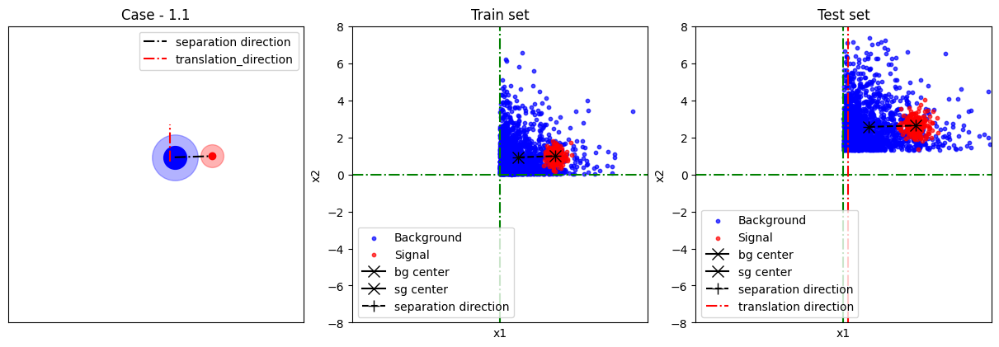

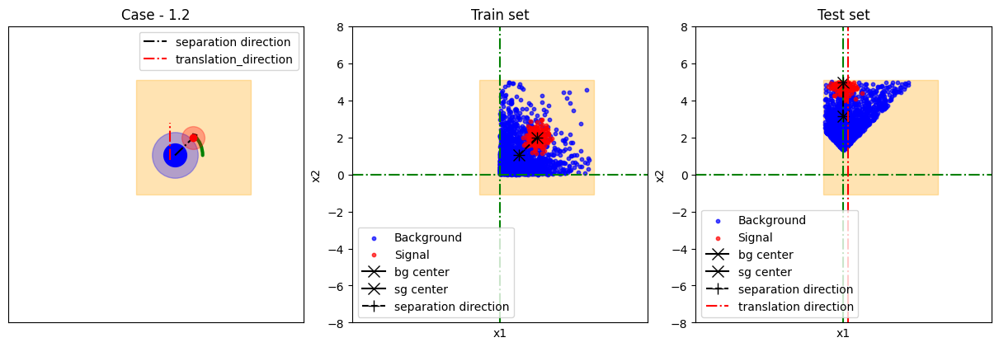

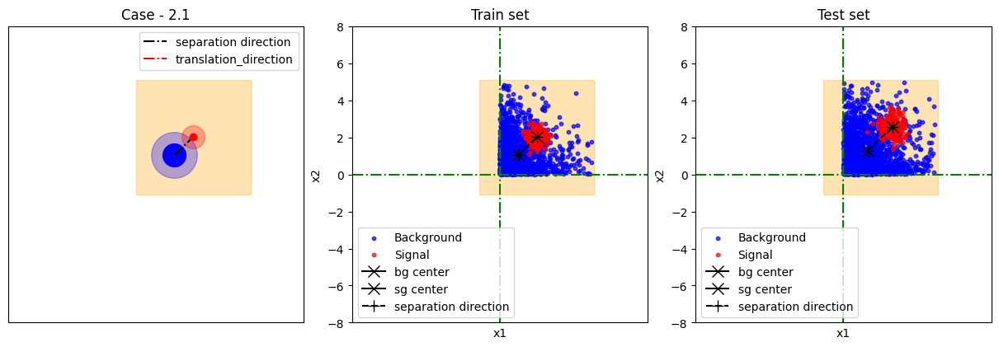

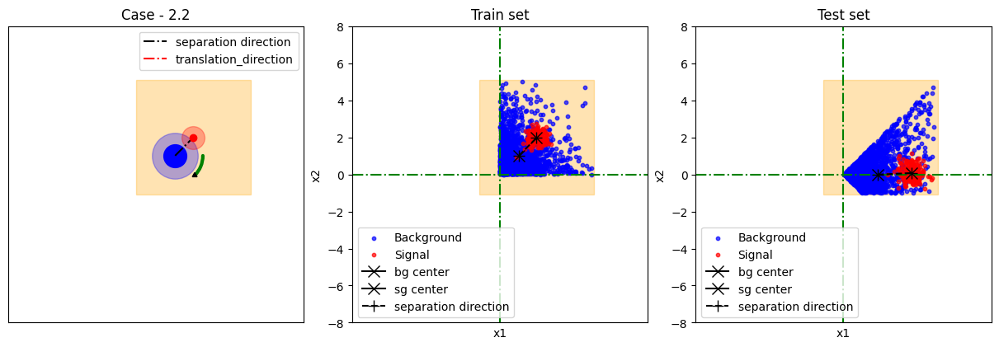

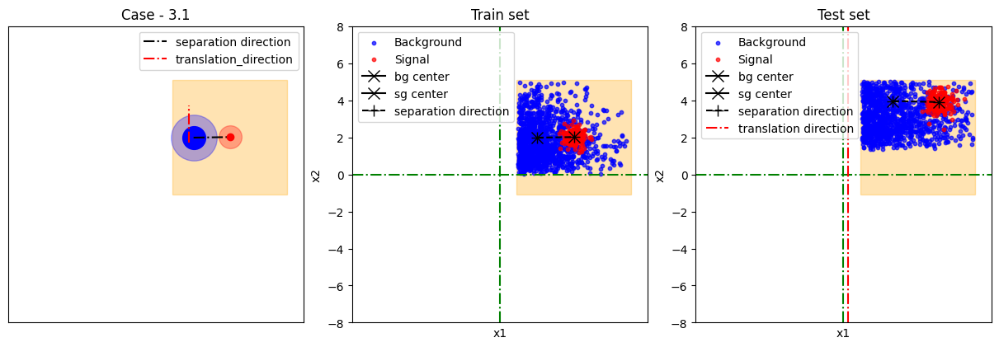

...

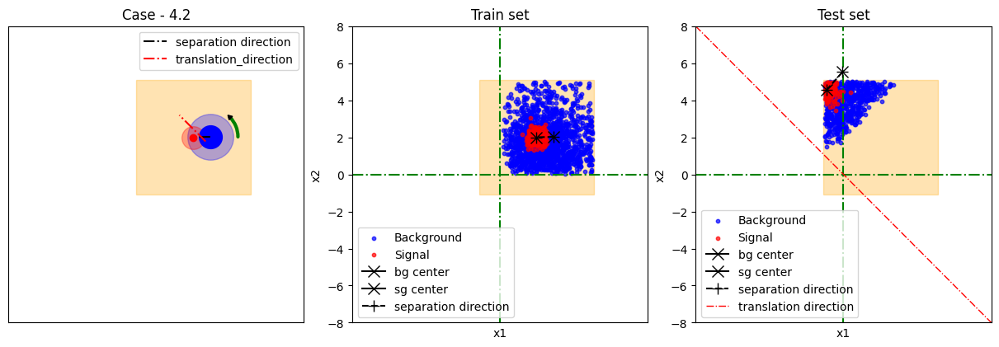

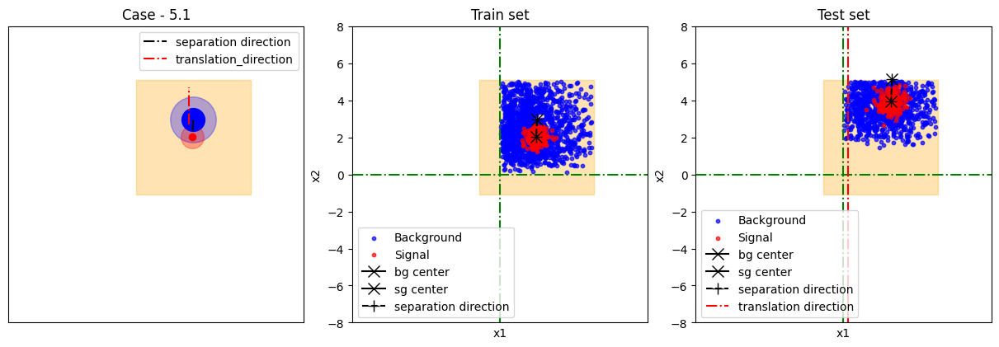

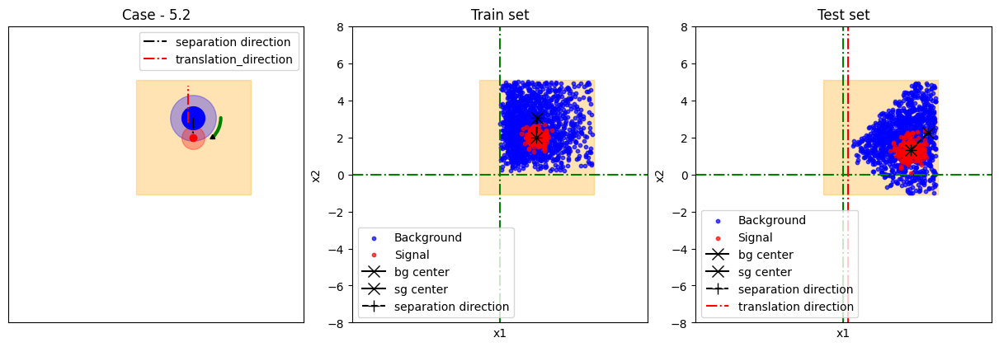

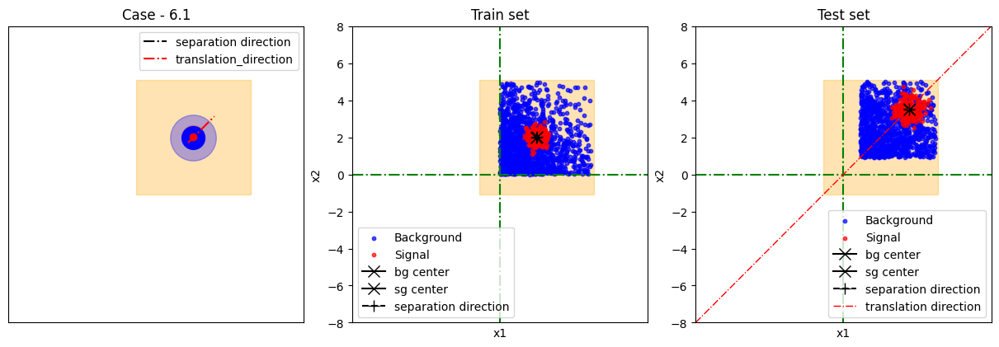

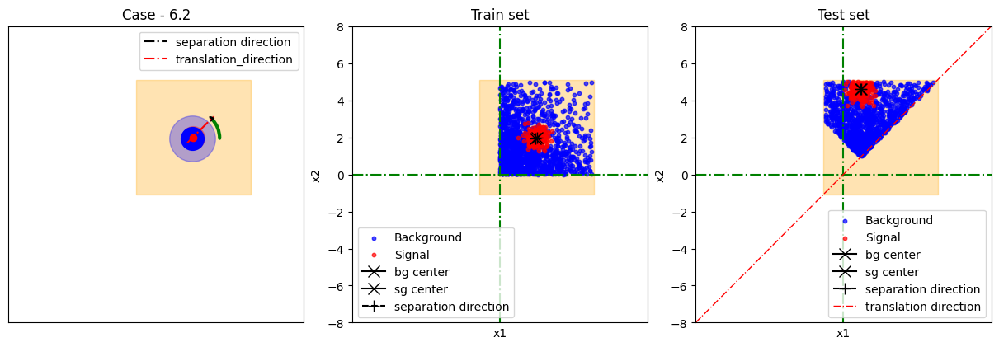

In [61]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])
    #if index == 0:
    #    break

## 5.4 - Set parameters for DANN

In [62]:
input_size  = (2,)
hp_lambda = 1.0
num_epochs  = 100
batch_size  = 100
half_batch_size = batch_size // 2
num_source_samples = 2000
num_target_samples = 2000
train_steps_per_epoch = math.ceil(num_source_samples / half_batch_size)
test_steps_per_epoch  = math.ceil(num_target_samples / batch_size)

## 5.5 - Prepare data for DANN

In [63]:
from DANN import set_data_for_DANN,build_datasets_for_DANN

In [64]:
x_sources, y_sources, x_targets, y_targets = set_data_for_DANN (train_sets,test_sets)

In [65]:
training_datasets, testing_datasets = build_datasets_for_DANN (x_sources,y_sources,x_targets,y_targets,settings,num_epochs, batch_size, portion_of_target_for_train=1)

## 5.6 - Use DANN

In [66]:
from DANN import (build_DANN,
                  compile_DANN,
                  fit_DANN,
                  evaluate_DANN)
from visualize import visualize_DANN_boundaries

Started to work with DANN_1
63/63 [==============================] - 0s 1ms/step


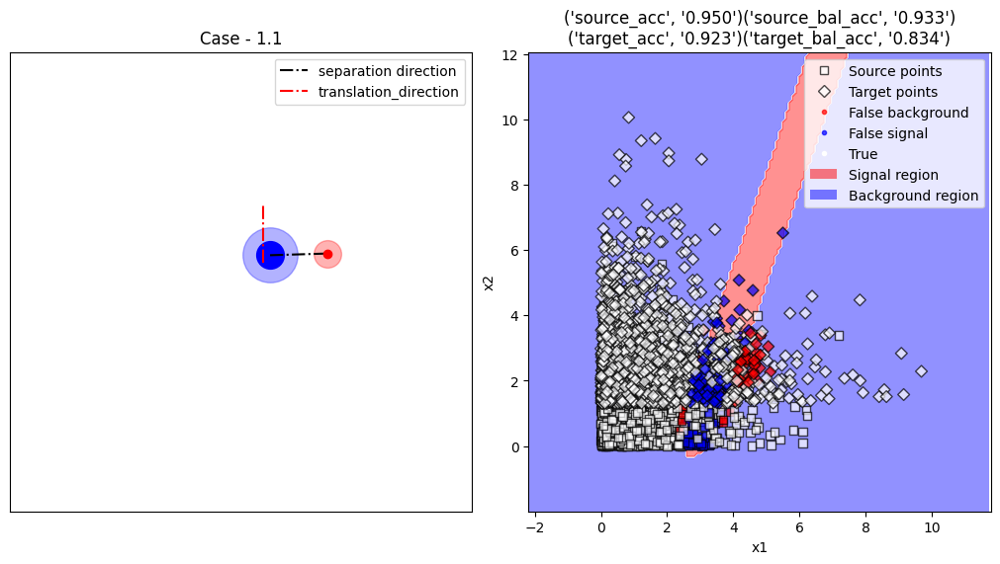

617/617 [==============================] - 1s 2ms/step


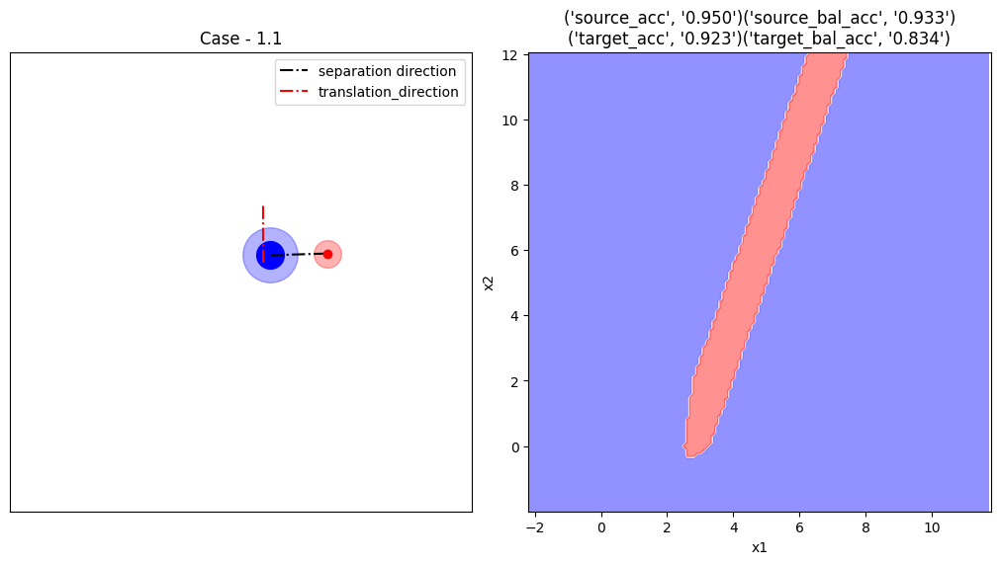

Started to work with DANN_2
48/48 [==============================] - 0s 997us/step


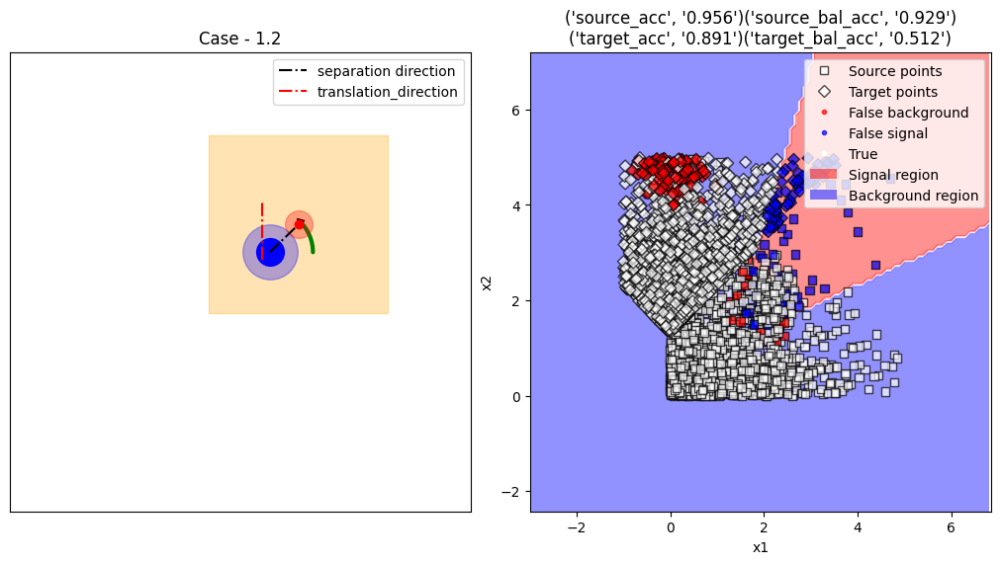

301/301 [==============================] - 0s 1ms/step


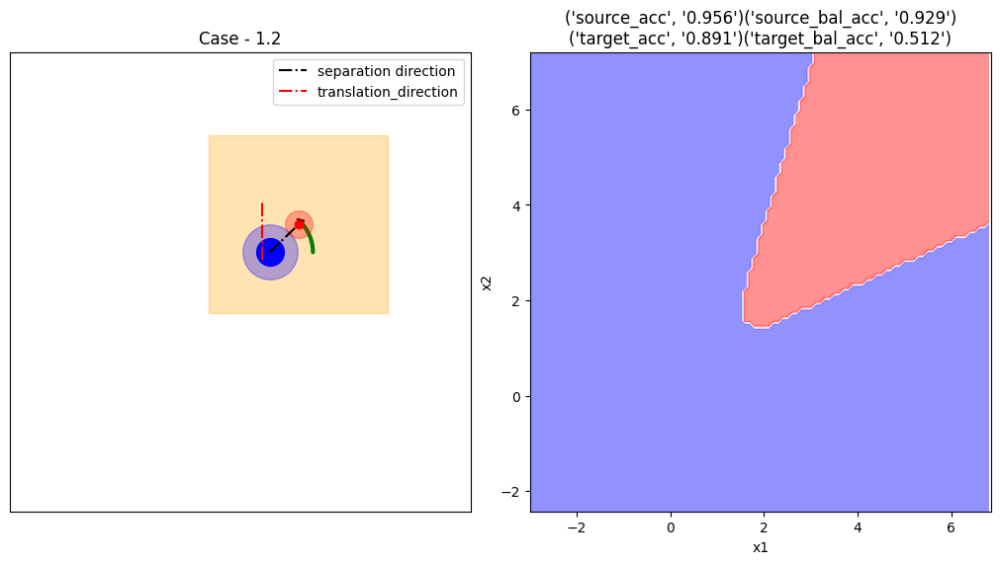

Started to work with DANN_3
61/61 [==============================] - 0s 1ms/step


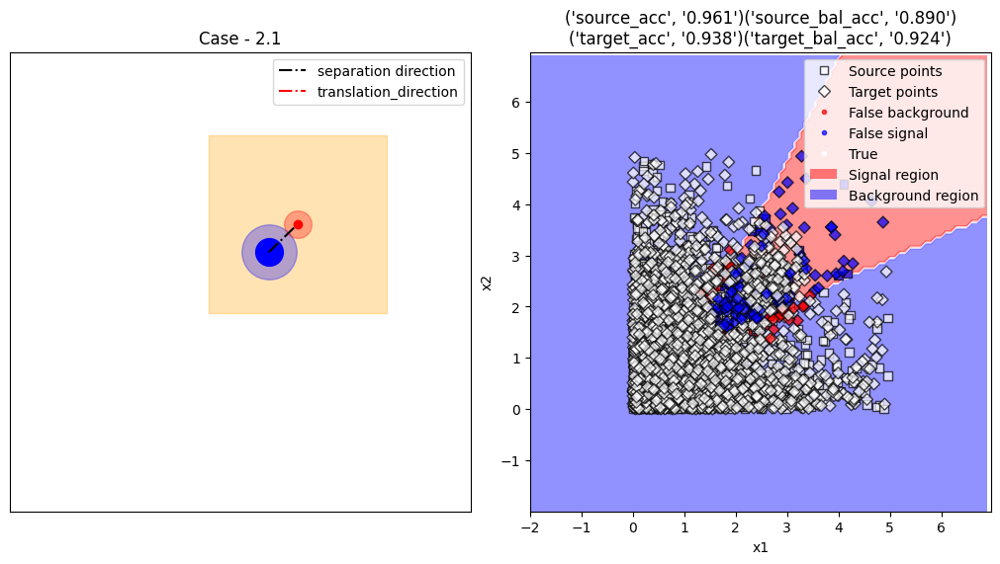

254/254 [==============================] - 0s 1ms/step


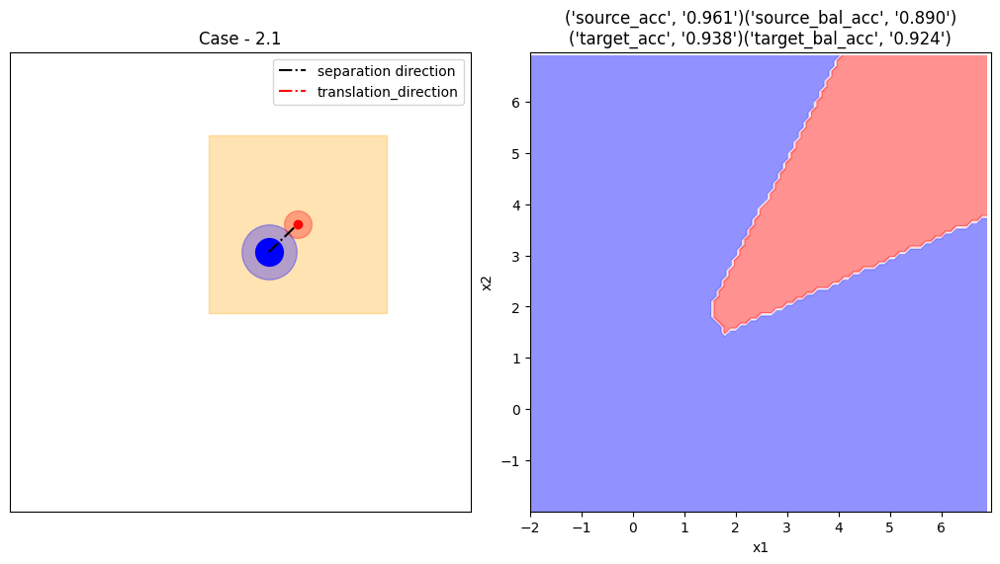

Started to work with DANN_4
53/53 [==============================] - 0s 1ms/step


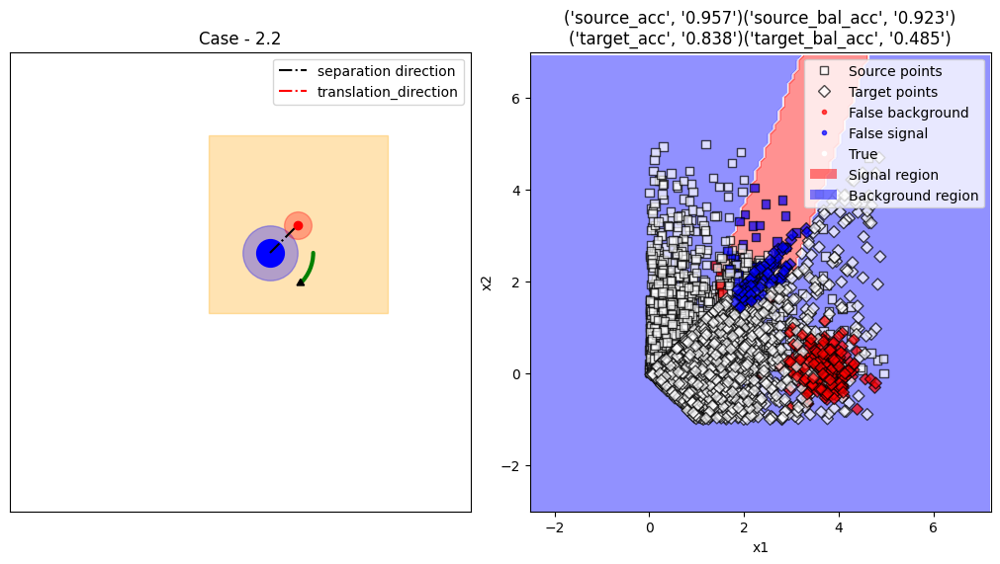

307/307 [==============================] - 0s 1ms/step


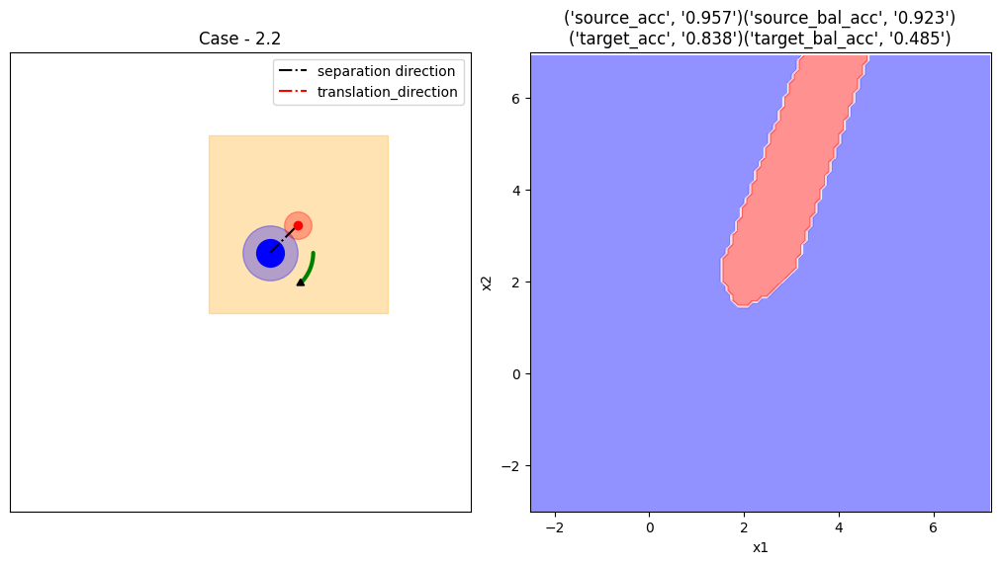

Started to work with DANN_5
41/41 [==============================] - 0s 1ms/step


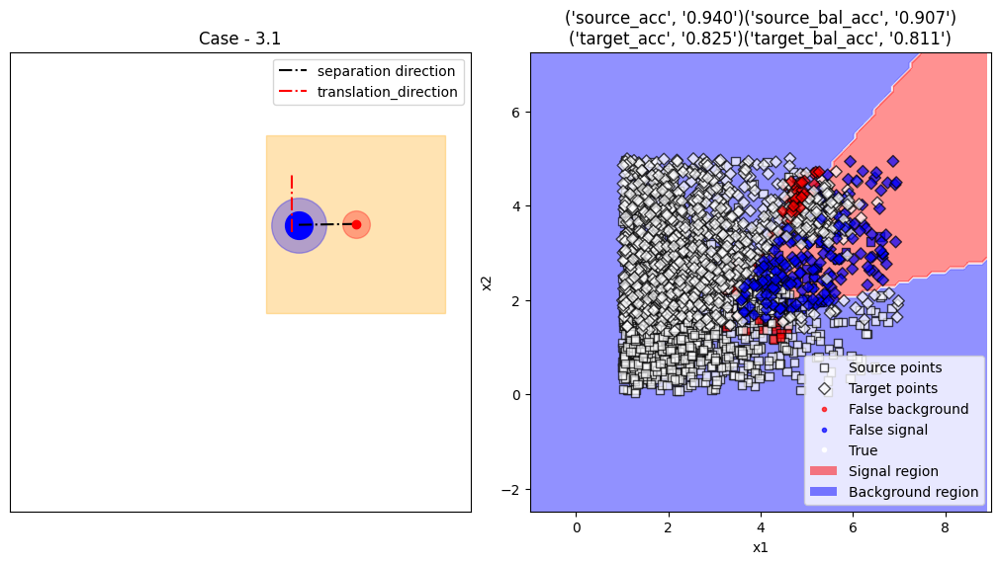

307/307 [==============================] - 0s 1ms/step


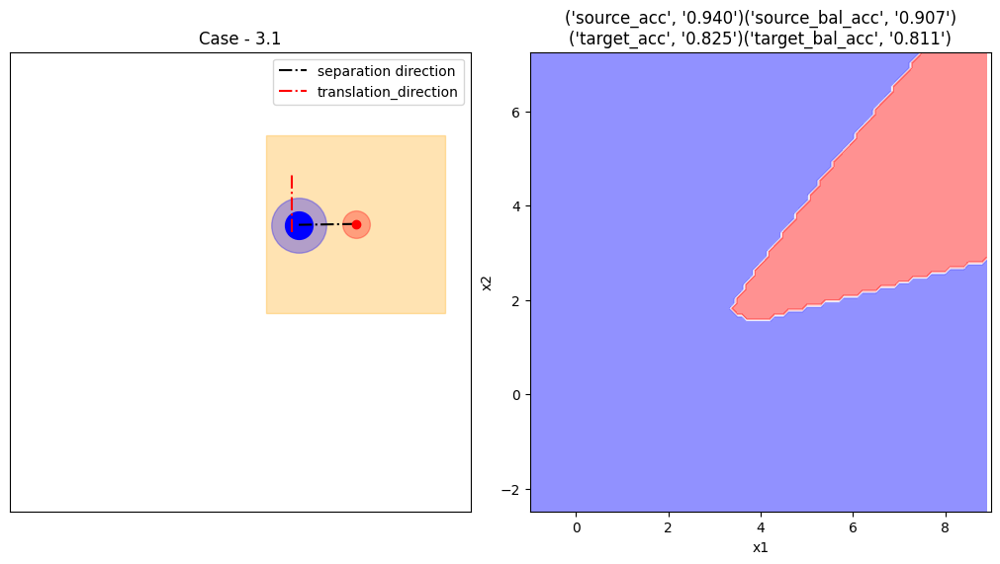

Started to work with DANN_6
51/51 [==============================] - 0s 2ms/step


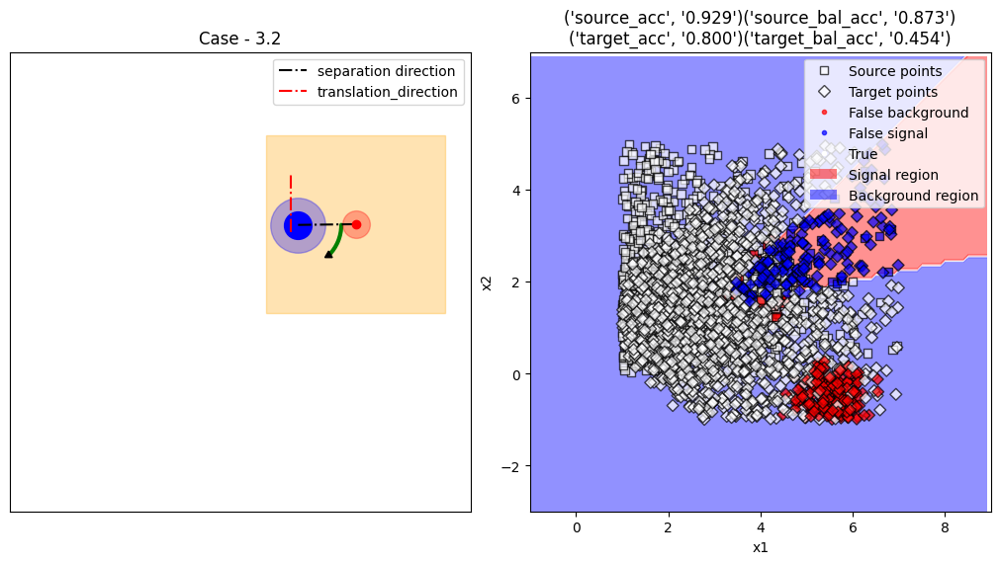

313/313 [==============================] - 0s 1ms/step


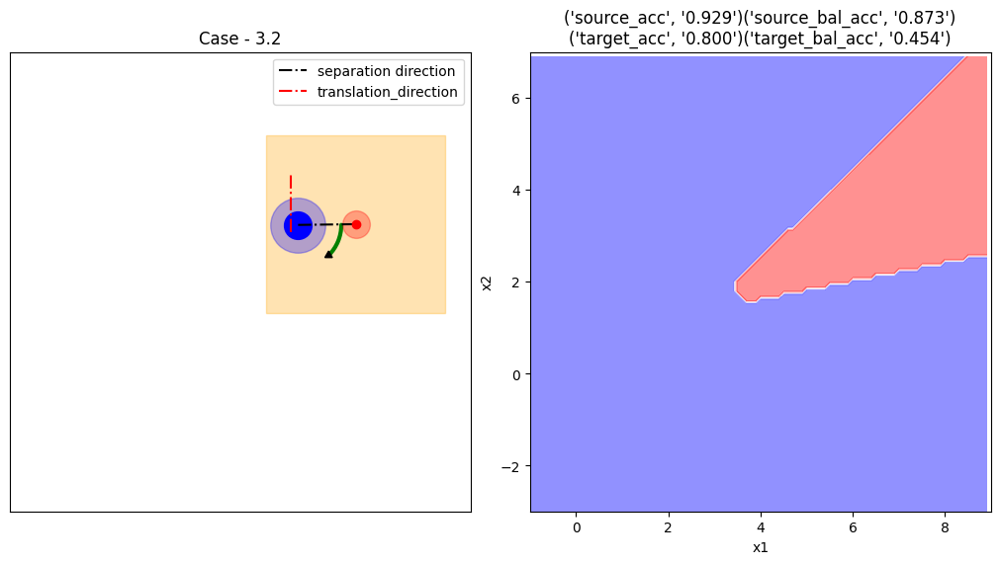

Started to work with DANN_7
45/45 [==============================] - 0s 1ms/step


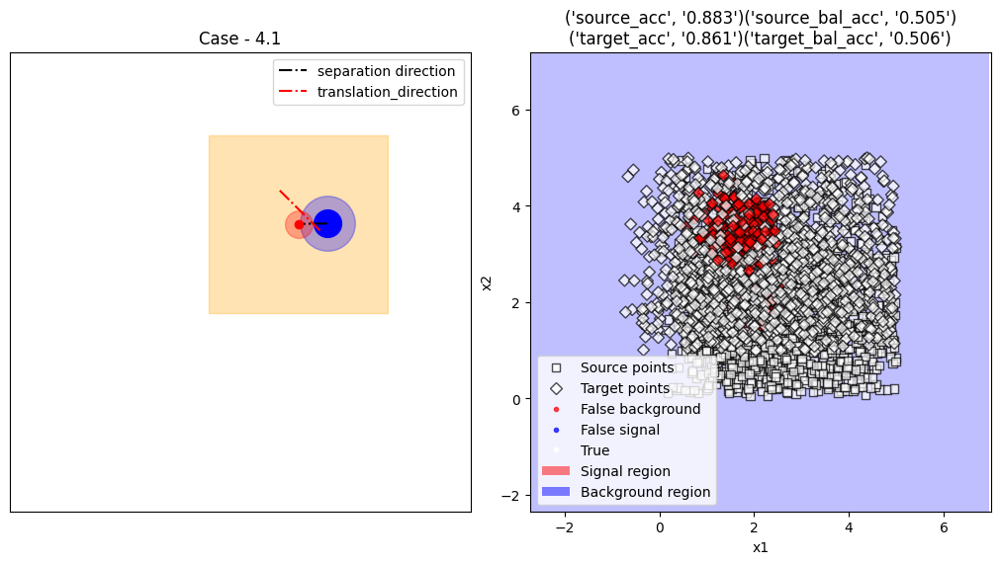

294/294 [==============================] - 0s 2ms/step


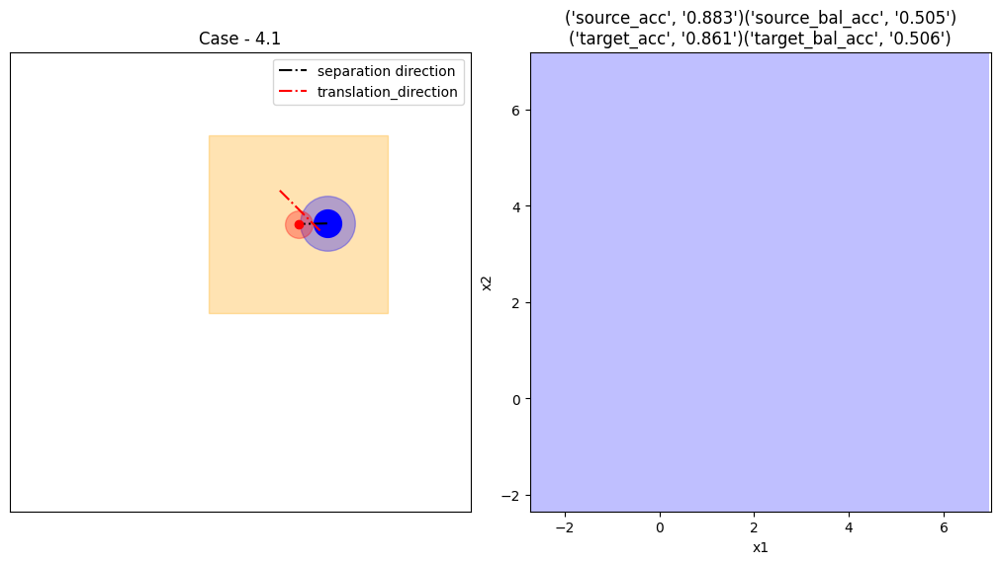

Started to work with DANN_8
23/23 [==============================] - 0s 713us/step


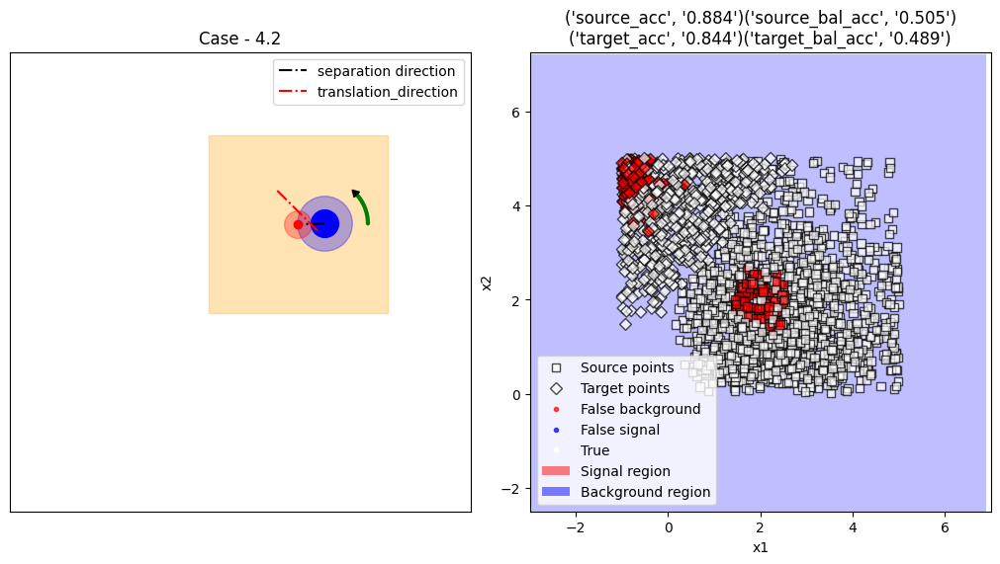

307/307 [==============================] - 0s 1ms/step


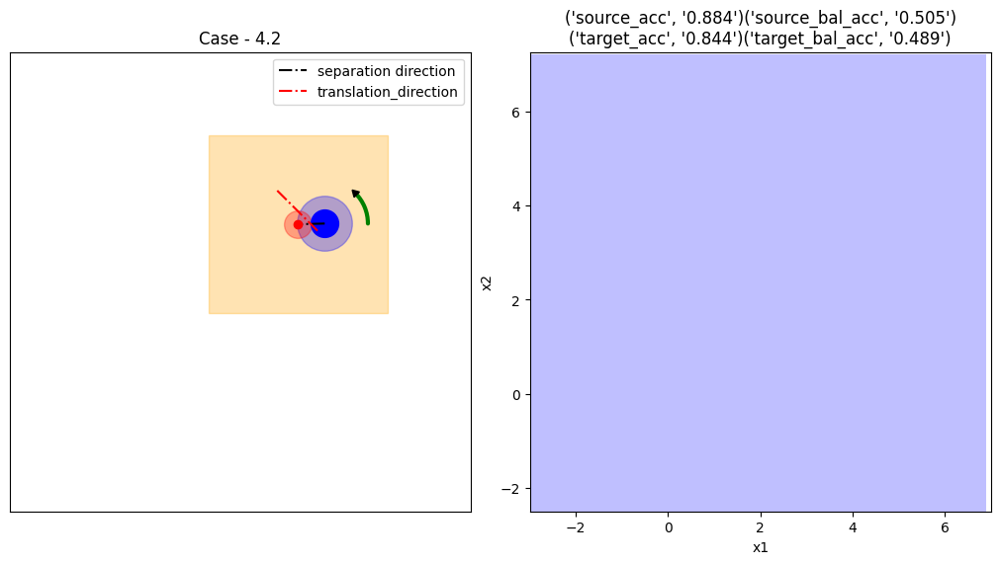

Started to work with DANN_9
35/35 [==============================] - 0s 928us/step


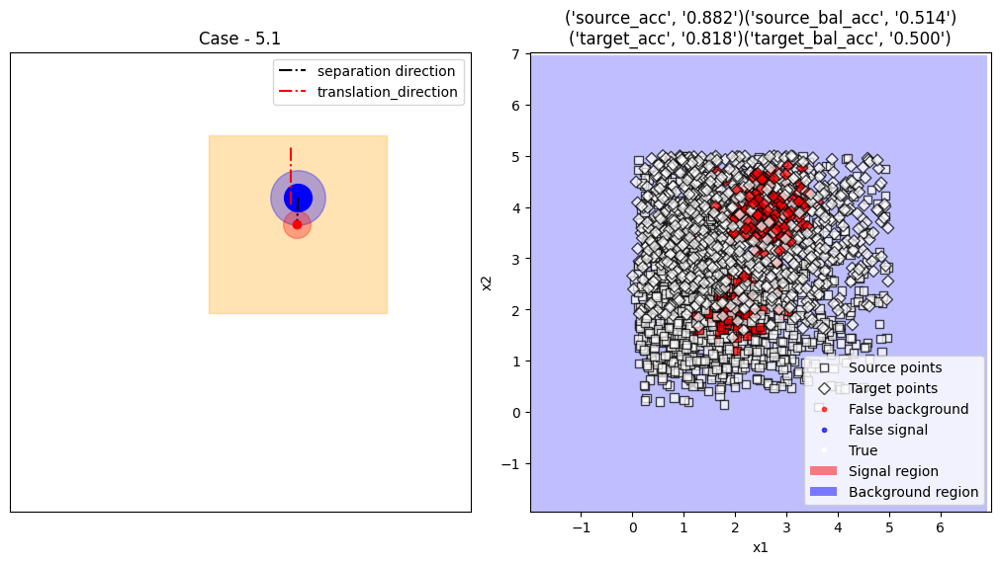

254/254 [==============================] - 0s 2ms/step


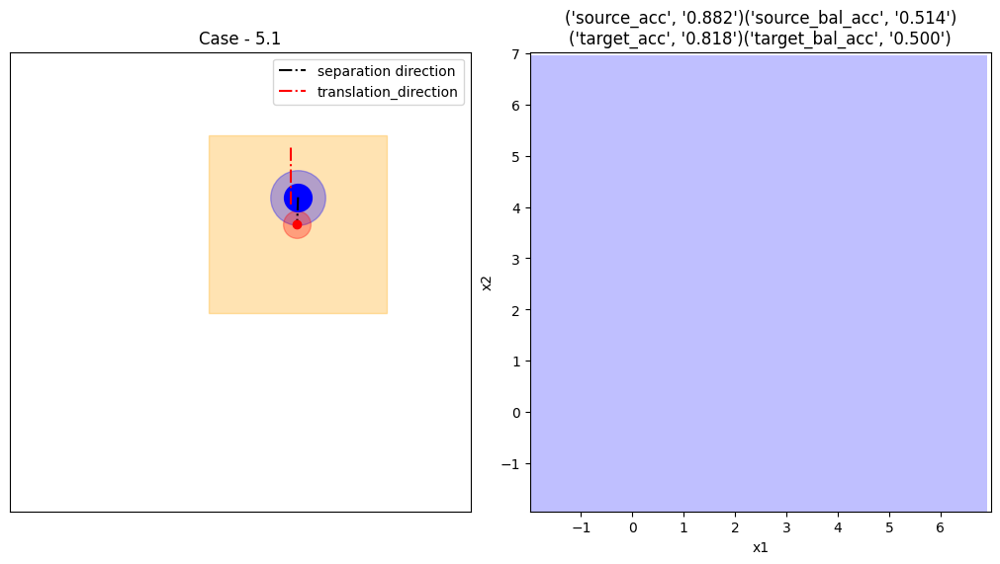

Started to work with DANN_10
41/41 [==============================] - 0s 1ms/step


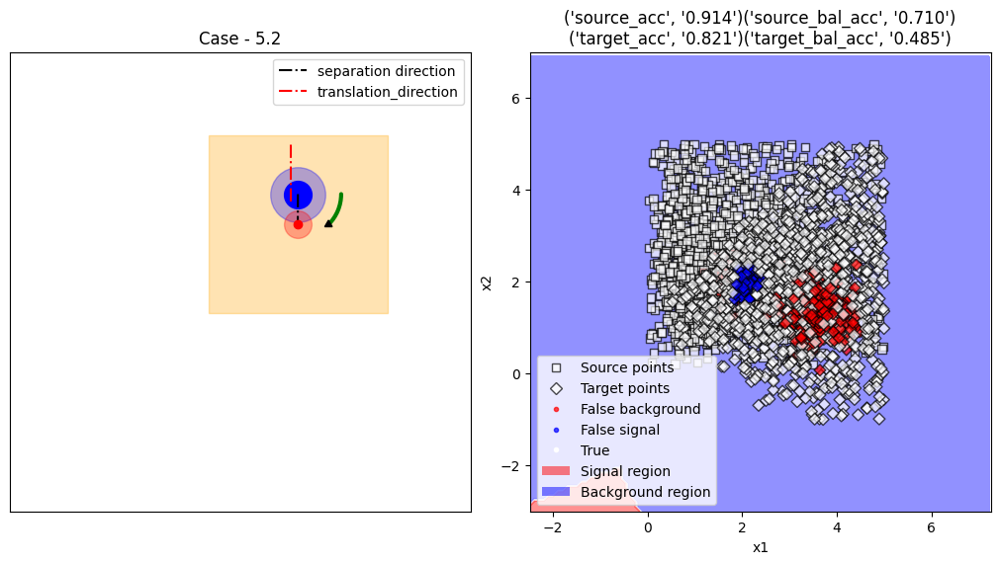

307/307 [==============================] - 0s 1ms/step


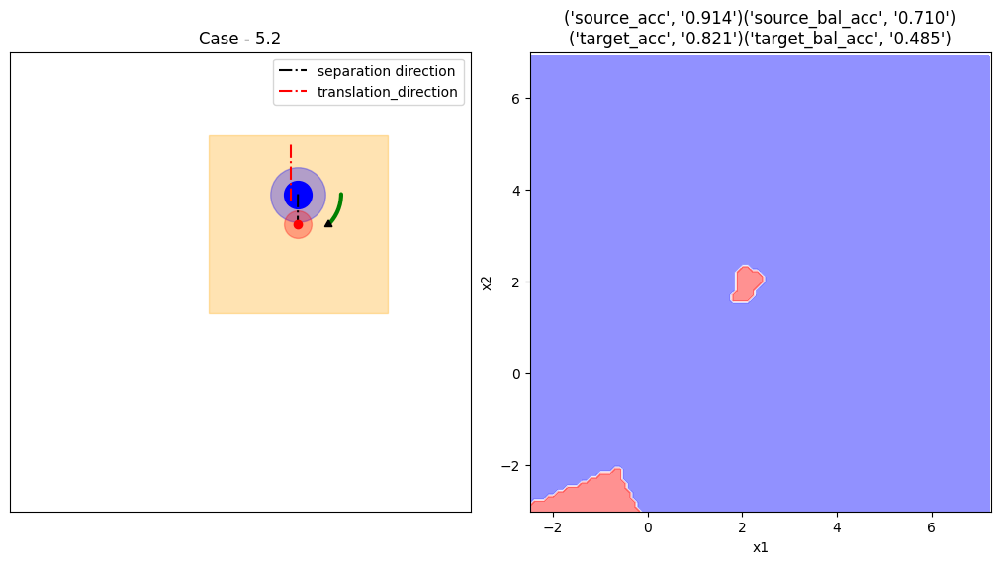

Started to work with DANN_11
41/41 [==============================] - 0s 781us/step


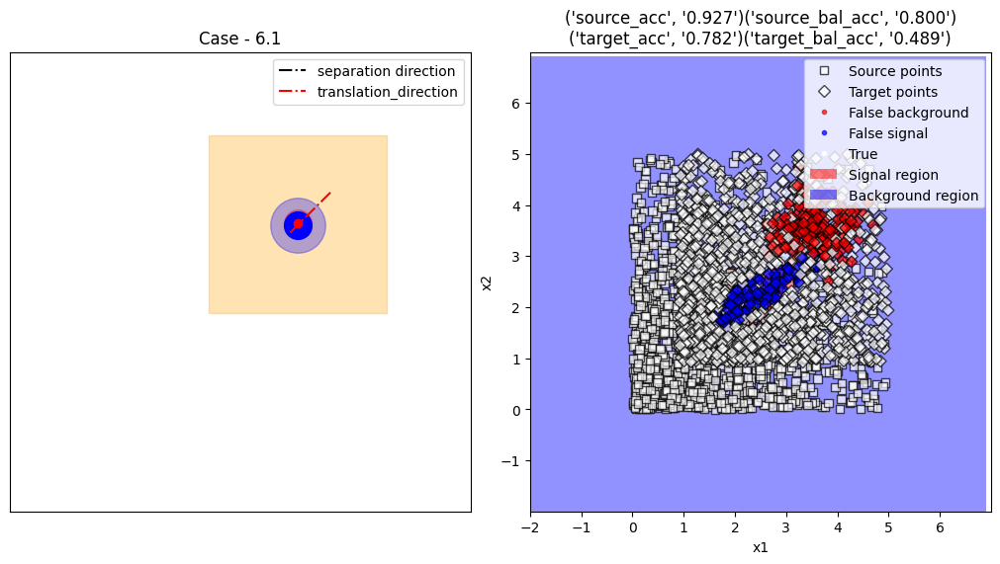

254/254 [==============================] - 0s 1ms/step


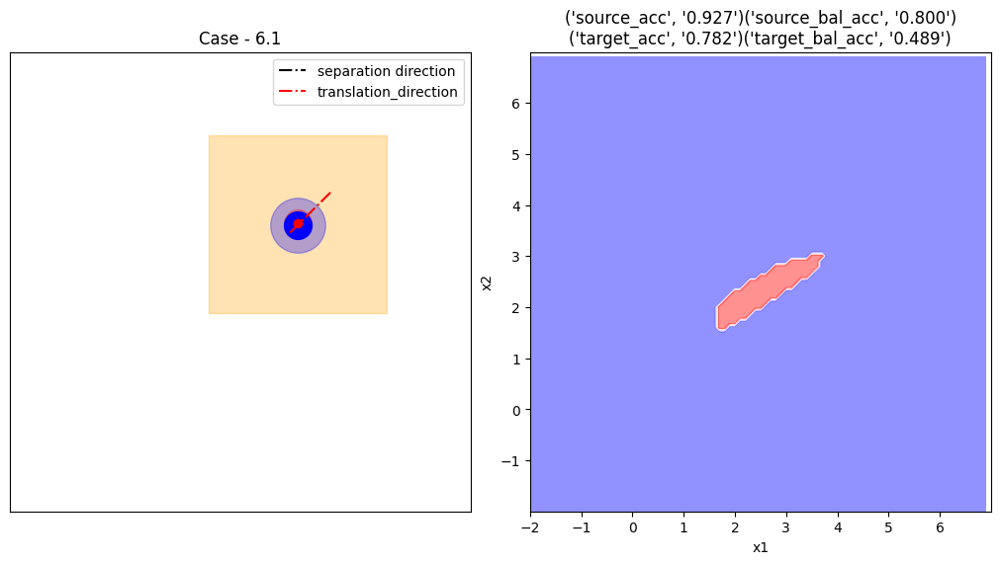

Started to work with DANN_12
39/39 [==============================] - 0s 1ms/step


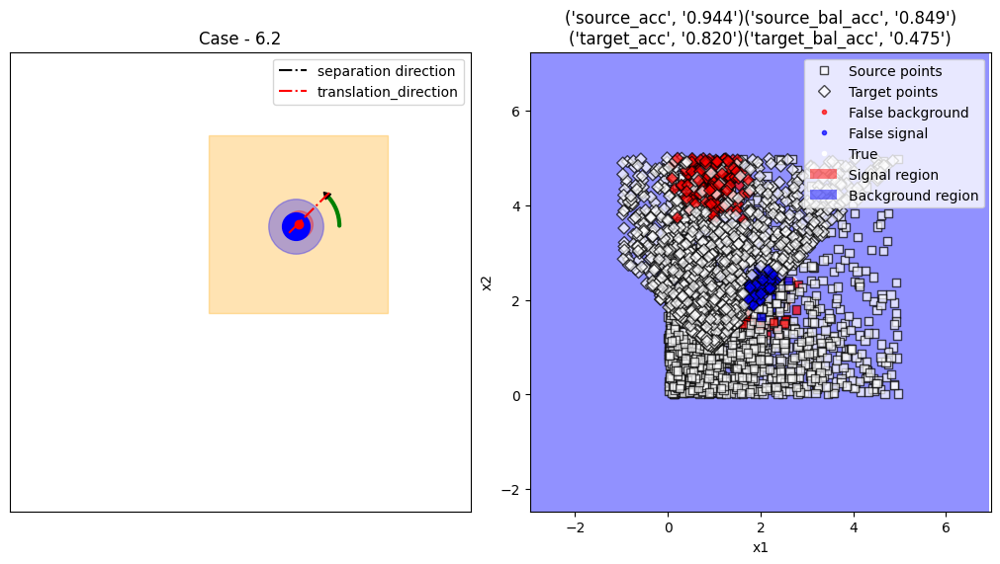

307/307 [==============================] - 0s 1ms/step


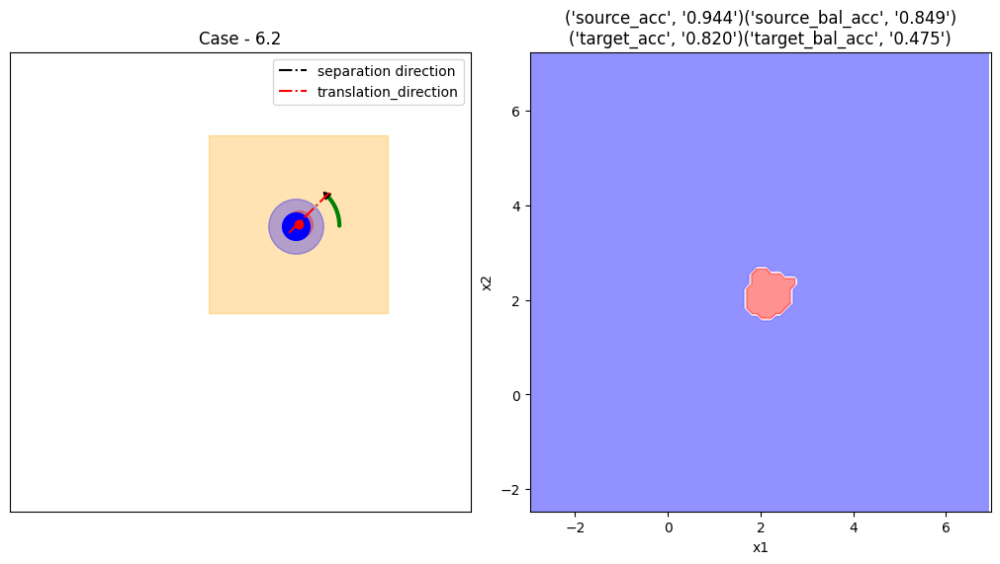

In [67]:
for i,data_pack in enumerate(zip(training_datasets,testing_datasets,x_sources,y_sources,x_targets,y_targets,settings)):
    # Unpack
    training_dataset,testing_dataset,x_source,y_source,x_target,y_target,setting = data_pack
    
    # Build DANN
    DANN_model = build_DANN("DANN_"+str(i+1),input_size,hp_lambda)
    print("Started to work with", DANN_model.name)
    
    # Compile DANN
    compile_DANN(DANN_model)
    
    # Fit DANN
    fit_DANN(DANN_model,training_dataset,testing_dataset,num_epochs,train_steps_per_epoch,test_steps_per_epoch)

    # Evaluate DANN
    results = evaluate_DANN(DANN_model,x_source, y_source, x_target, y_target)
    
    # Visualize DANN
    show_points = True
    visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)
    show_points = False
    visualize_DANN_boundaries(DANN_model, x_source.values, y_source, x_target.values, y_target, setting, results, show_points)